# Batch processing for rest and after exercise recordings
## Facultad de Ciencias, UNAM
### Ana Daniela del Río Pulido and Erin C. McKiernan

There are two major goals:
- To identify the differences that we can see using different techniques in rest and after exercise. 
- To identify selection criteria for choosing electrocardiogram recordings to analyze.

At the end of this notebook, the student will be able to identify the characteristics of a good recording, based on the comparison of several recordings. Functions used in previous notebooks will be used and we will introduce an object for doing batch processing.

If you are in this notebook, I guess you have passed through the previous techniques. In all of them, we have mentioned a brief comparison between data when the subject is at rest and when the person has just finished performing an exercise. In this notebook, we bring all these techniques together. What information will we be able to obtain from each of them? In the first two techniques we will be analyzing the R-R interval time series, while in the last two we will analyze the whole ECG time series.

Techniques using the R-R interval time series:

*  Standard technique: R-R intervals and QRS complex

*  Poincaré plots

Techniques using the R-R interval time series:

*  Phase space reconstruction

*  Recurrence plot

# Setting up the notebook

We begin by setting up the Jupyter notebook and importing the Python modules needed for plotting figures, create animations, etc. We include commands to view plots in the Jupyter notebook, and to create figures with good resolution and large labels. These commands can be customized to produce figures with other specifications.

In [1]:
# Imports python libraries
import numpy as np
import random as rd
import wave
import sys
import os
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from scipy.signal import butter, lfilter, filtfilt #for filtering data
from statistics import stdev
import matplotlib as mpl
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
sys.path.insert(1, r'./../functions') # add to pythonpath

# commands to create high-resolution figures with large labels
%config InlineBackend.figure_formats = {'png', 'retina'} 
plt.rcParams['figure.dpi'] = 50
plt.rcParams['axes.labelsize'] = 16 # fontsize for figure labels
plt.rcParams['axes.titlesize'] = 18 # fontsize for figure titles
plt.rcParams['font.size'] = 14 # fontsize for figure numbers
plt.rcParams['lines.linewidth'] = 1.4 # line width for plotting

## Extracting data

ECG recordings were obtained using the Backyard Brains Heart and Brain Spiker Box. The recordings are saved as audio files in .wav format. The first thing we have to do is open the .wav files and extract the data. We can extract the number of recording channels, sampling rate, etc.

In [2]:
#Function that extracts the number of recording channels, sampling rate, time and signal
#variable is the path and filename of the .wav file
def ecg(variable):
    record = wave.open(variable, 'r') # load the data

    # Get the number of channels, sample rate, etc.
    numChannels = record.getnchannels() #number of channels
    numFrames = record.getnframes() #number of frames
    sampleRate = record.getframerate() #sampling rate
    sampleWidth = record.getsampwidth()
    
    # Get wave data
    dstr = record.readframes(numFrames * numChannels)
    waveData = np.frombuffer(dstr, np.int16)

    # Get time window
    timeECG = np.linspace(0, len(waveData)/sampleRate, num=len(waveData))

    return timeECG, waveData

# R peaks

Function for detecting R peaks. We will be able to calculate the heart frequency and R-R intervals.

The following function creates an array of values which surpass a certain threshold. Afterwards, it determines the maximum value of this array and adds it in the R-vector. And this is repeated until the end of the time series.

In [3]:
def detecta_maximos_locales(timeECG, waveData, threshold_ratio=0.7):
    # If not all the R peaks are detected, lower the threshold_ratio
    # If components that are not R peaks (like T waves) are detected, higher the threshold_ratio

    if len(timeECG) != len(waveData): #Raises an error if the two arrays have different lengths
        raise Exception("The two arrays have different lengths.")
    
    interval = max(waveData) - min(waveData)
    threshold = threshold_ratio*interval + min(waveData)
    maxima = []
    maxima_indices = []
    mxs_indices = []
    banner = False
    
    for i in range(0, len(waveData)):
            
        if waveData[i] >= threshold:#If a threshold value is surpassed,
            # the indices and values are saved 
            banner = True
            maxima_indices.append(i)
            maxima.append(waveData[i])
            
        elif banner == True and waveData[i] < threshold: #If the threshold value is crossed
            # the index of the maximum value in the original array is saved
            index_local_max = maxima.index(max(maxima))
            mxs_indices.append(maxima_indices[index_local_max])
            maxima = []
            maxima_indices = []
            banner = False     

    return mxs_indices

In [4]:
# If the input of this function is time, the intervals will be given in those same units
# Obtaining the indexes at which the R peaks occur.
def R_intervals(time_indices):
    
    length = len(time_indices)
    intervals = np.zeros(length-1)

    for i in range(0, length-1):
        intervals[i] = time_indices[i+1]-time_indices[i]
    
    return intervals

In [5]:
def local_mins(waveData, mxs_indices, n =700):
    mins_vec = []

    for R_peak_i in mxs_indices: #Aqui estaba el error
        left_interval = waveData[R_peak_i-n:R_peak_i]
        right_interval = waveData[R_peak_i:R_peak_i+n]

        mins_vec.append(R_peak_i - n + (list(left_interval).index(min(left_interval))) )
        mins_vec.append(R_peak_i + (list(right_interval).index(min(right_interval))) )
        
    return mins_vec

# Comencing the analysis

For analyzing several recordings at the same time, we must obtain the names of every file. One option is to extract the file names one by one, but another option is just to give a folder's name and extract the recordings from there. 

In [6]:
# Option 1

recordings = ["ECG_samples/S1_rest.wav", "ECG_samples/S1_exercise.wav", 
             "ECG_samples/S2_rest.wav", "ECG_samples/S2_exercise.wav",
             "ECG_samples/S3_rest.wav", "ECG_samples/S3_exercise.wav",
             "ECG_samples/S4_rest.wav", "ECG_samples/S4_exercise.wav",
             "ECG_samples/T1_rest.wav", "ECG_samples/T1_exercise.wav",
             "ECG_samples/T2_rest.wav", "ECG_samples/T2_exercise.wav",
             "ECG_samples/T4_rest.wav", "ECG_samples/T4_exercise.wav"]

subjects = [] 

In [7]:
# Option 2

InputPath = "ECG_morfo2/" #Folder where the original files are
subject_rest = []
subject_exer = []

#In this case, files must be inside folders inside the folder where this notebook is
TheList = os.listdir(InputPath)

for TheFile in TheList:
    
    TheFileName, TheFileExtension = os.path.splitext(TheFile) # breaks file name into pieces based on periods

    InputFilePath = InputPath + TheFileName + TheFileExtension # Full path to file

    if (TheFileExtension==".wav"): # Only interested in .wav files
        
        if 'rest' in TheFileName:
            subject_rest.append(InputFilePath)
            
        elif 'exer' in TheFileName:
            subject_exer.append(InputFilePath)
            
print(subject_rest)
print(subject_exer)

['ECG_morfo2/T1_rest_5s.wav', 'ECG_morfo2/X3_rest.wav', 'ECG_morfo2/T4_rest.wav', 'ECG_morfo2/X2_rest.wav', 'ECG_morfo2/T2_rest.wav', 'ECG_morfo2/X1_rest.wav', 'ECG_morfo2/S3_rest.wav', 'ECG_morfo2/T1_rest.wav', 'ECG_morfo2/S4_rest.wav', 'ECG_morfo2/X4_rest.wav', 'ECG_morfo2/T3_rest.wav', 'ECG_morfo2/S2_rest.wav', 'ECG_morfo2/S1_rest.wav']
['ECG_morfo2/S2_exercise.wav', 'ECG_morfo2/T2_exercise.wav', 'ECG_morfo2/S3_exercise.wav', 'ECG_morfo2/X4_exercise.wav', 'ECG_morfo2/X2_exercise.wav', 'ECG_morfo2/T4_exercise.wav', 'ECG_morfo2/S1_exercise.wav', 'ECG_morfo2/S4_exercise.wav', 'ECG_morfo2/X3_exercise.wav', 'ECG_morfo2/T3_exercise.wav', 'ECG_morfo2/T1_exercise.wav', 'ECG_morfo2/X1_exercise.wav']


Notice that in Option 2 it is important that the recordings appear in any order, but in the same one in both lists: ``subject_rest`` and ``subject_exer``. It cannot happen that the first entry of the first list is ``"subjectA_rest"`` and the second list is ``"subjectC_exer"``.

Now we introduce an object. Notice that in this notebook we are dealing with t
This is because we are dealing with several subjects and each of them has the same properties: an electrocardiogram recording at rest, an electrocardiogram after performing exercise. And these two recordings have other properties related with them like R-R intervals and time when these R peaks happen. Instead of dealing with several arrays, an object is a data structure that could help you organize the data better.

In [7]:
# Object
class Sujeto:
  def __init__(self, timeECG_rest, waveData_rest, timeECG_exer, waveData_exer):
    #Rest
    self.timeECG_rest = timeECG_rest
    self.waveData_rest = waveData_rest
    
    self.mxs_indices_rest = detecta_maximos_locales(timeECG_rest, waveData_rest)    
    self.xx_rest = R_intervals(timeECG_rest[self.mxs_indices_rest])
    self.timeRpeaks_rest = timeECG_rest[self.mxs_indices_rest]
    
    #Exercise
    self.timeECG_exer = timeECG_exer
    self.waveData_exer = waveData_exer
    
    self.mxs_indices_exer = detecta_maximos_locales(timeECG_exer, waveData_exer)
    self.xx_exer = R_intervals(timeECG_exer[self.mxs_indices_exer])
    self.timeRpeaks_exer = timeECG_exer[self.mxs_indices_exer]

In [8]:
for i in range(0, 7):
    timeECG_rest, waveData_rest = ecg(recordings[2*i])
    timeECG_exer, waveData_exer = ecg(recordings[2*i+1])
    subjects.append(Sujeto(timeECG_rest, waveData_rest, timeECG_exer, waveData_exer))
    print("Finished subject ", i+1)

Finished subject  1
Finished subject  2
Finished subject  3
Finished subject  4
Finished subject  5
Finished subject  6
Finished subject  7


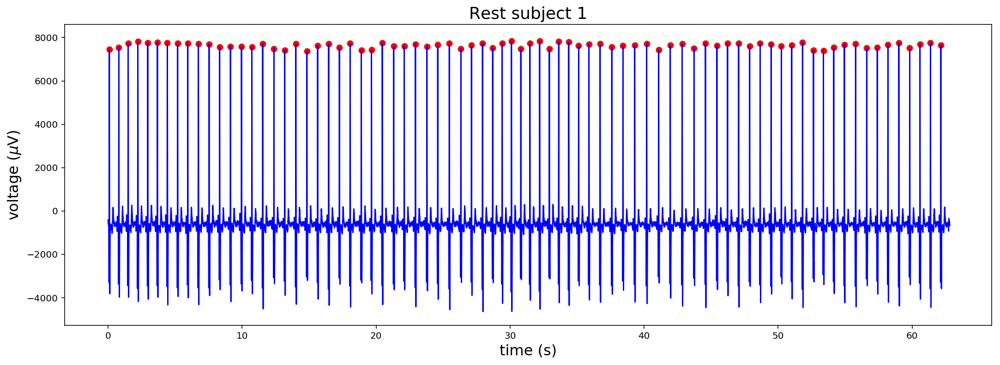

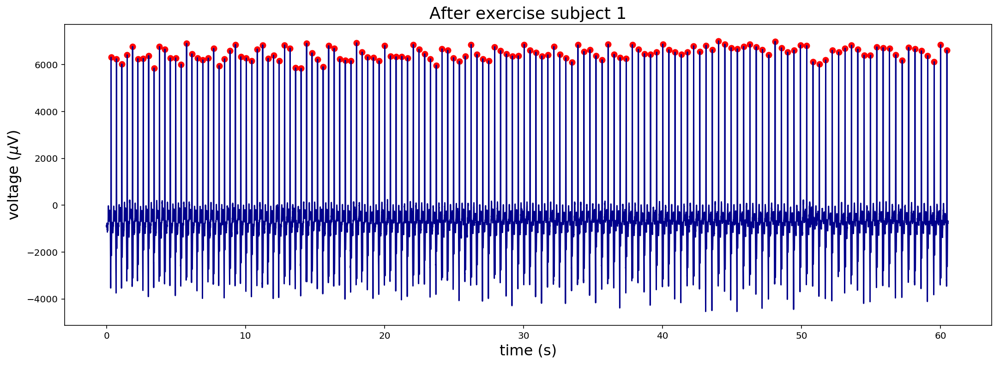

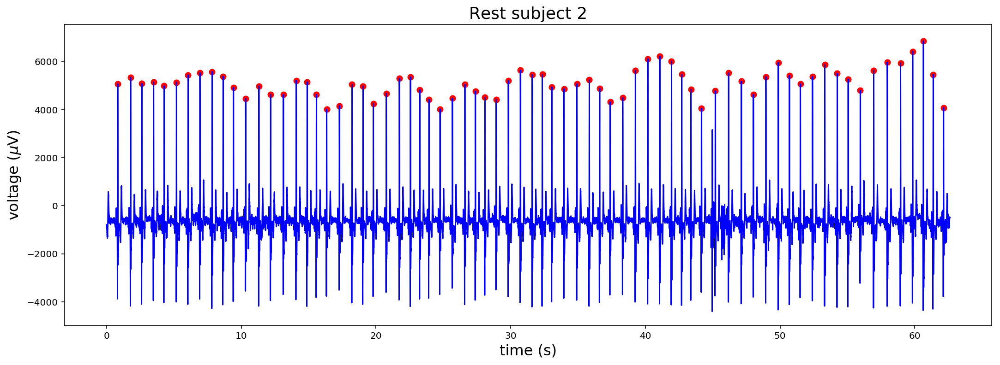

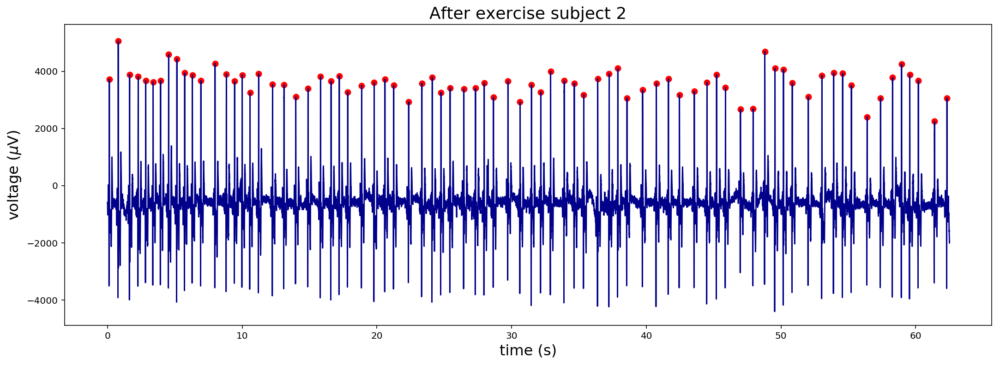

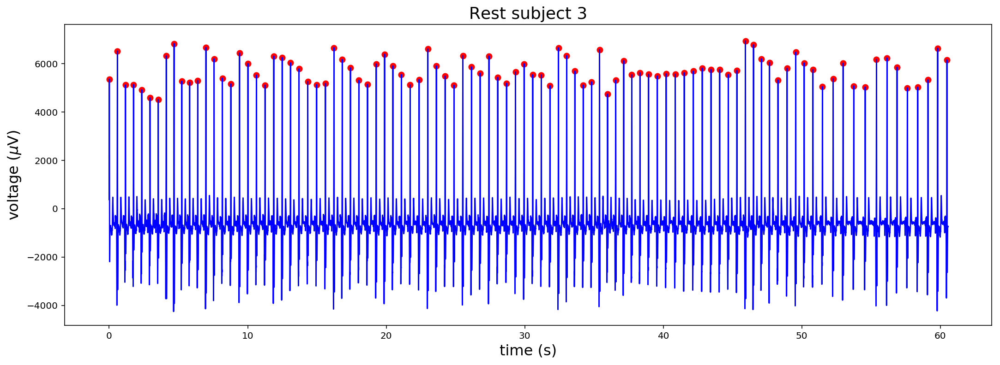

...

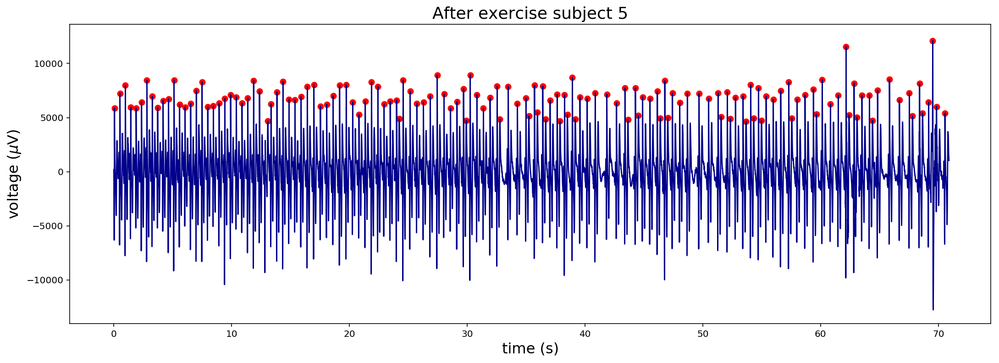

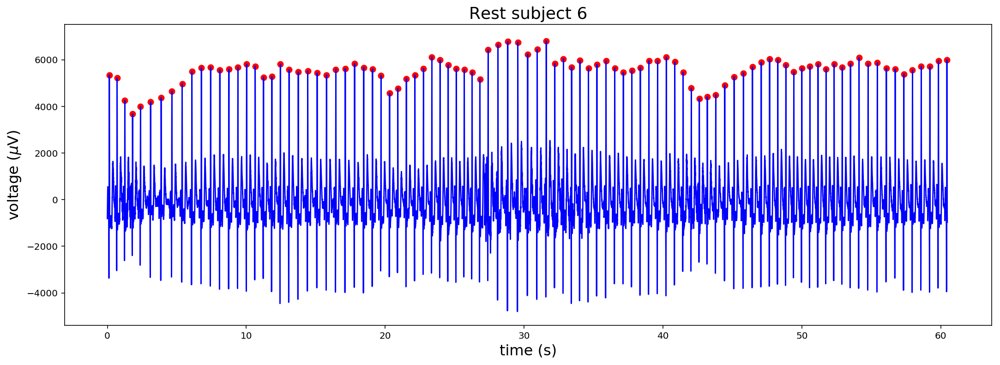

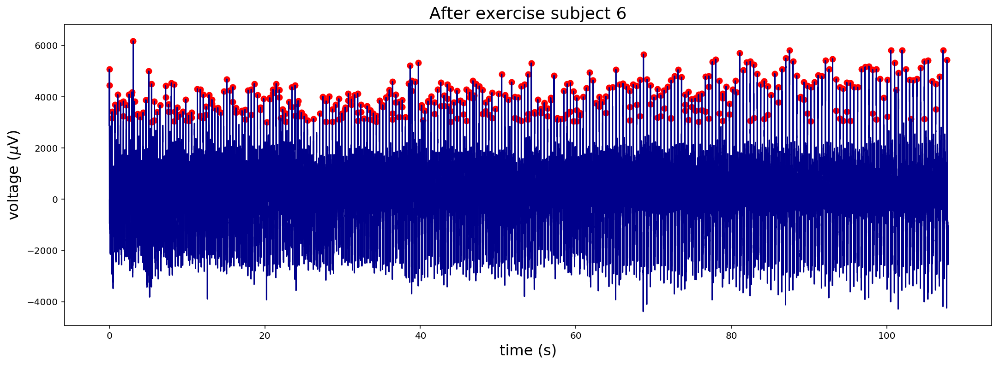

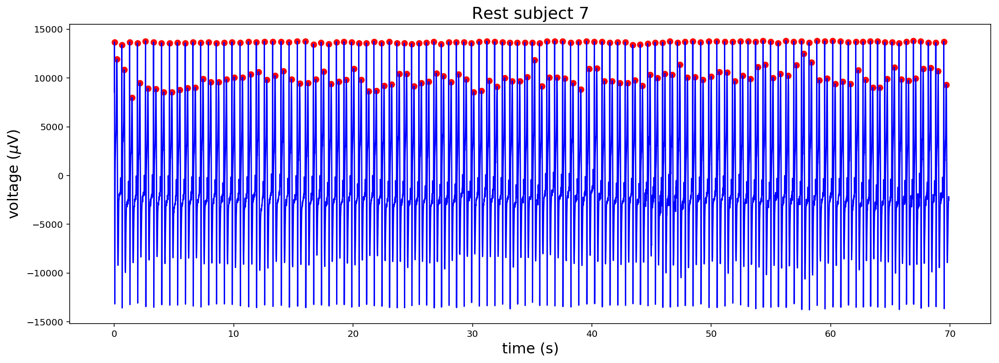

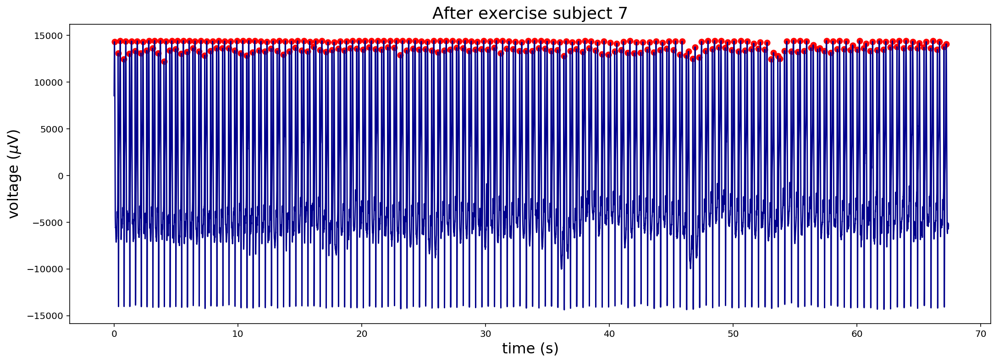

In [9]:
# Plotting ECG signal
for i in range(0, 7):
    plt.figure(figsize=(18,6))
    plt.xlabel(r'time (s)')
    plt.ylabel(r'voltage ($\mu$V)')
    plt.plot(subjects[i].timeECG_rest, subjects[i].waveData_rest, 'b')
    plt.scatter(subjects[i].timeECG_rest[subjects[i].mxs_indices_rest],
                subjects[i].waveData_rest[subjects[i].mxs_indices_rest],
                color='r')
    plt.title("Rest subject "+str(i+1))
    plt.show()
    
    plt.figure(figsize=(18,6))
    plt.xlabel(r'time (s)')
    plt.ylabel(r'voltage ($\mu$V)')
    plt.plot(subjects[i].timeECG_exer, subjects[i].waveData_exer, 'darkblue')
    plt.scatter(subjects[i].timeECG_exer[subjects[i].mxs_indices_exer],
                subjects[i].waveData_exer[subjects[i].mxs_indices_exer],
                color='r')
    plt.title("After exercise subject "+str(i+1))
    plt.show()

This is our first filter in peak selection. Based on which criteria will we exclude the recordings? We can start excluding recordings based on our eye with the previous graphs and a bad R-peak detection. For example, recordings where there was a bad R peak selection are:
- After exercise subject 4
- Rest subject 5
- After exercise subject 5
- After exercise subject 6
- Rest subject 7
- After exercise subject 7

This is only one way in which we can exclude data, we could also use as a criteria: a stable recording and no artifacts.

Because there was a good detection of R peaks in recordings 1, 2 and 3, we will use them for the following section.

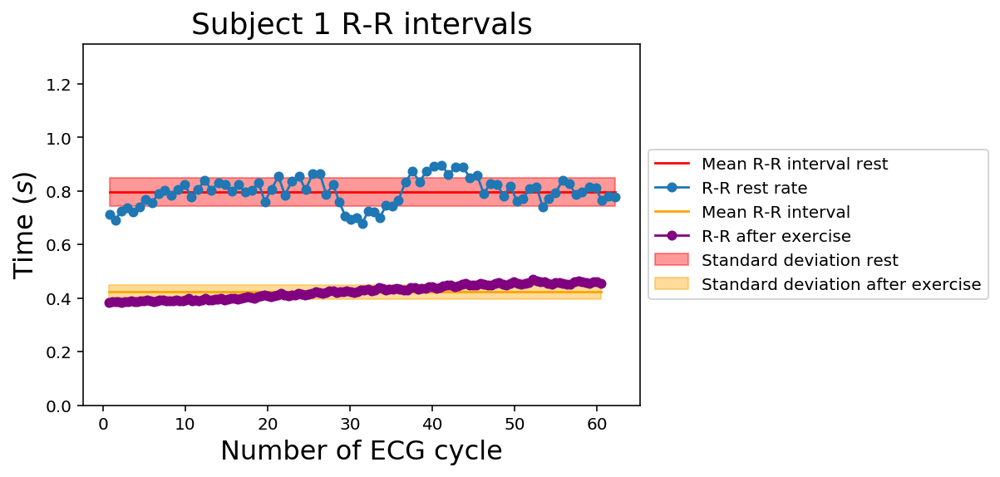

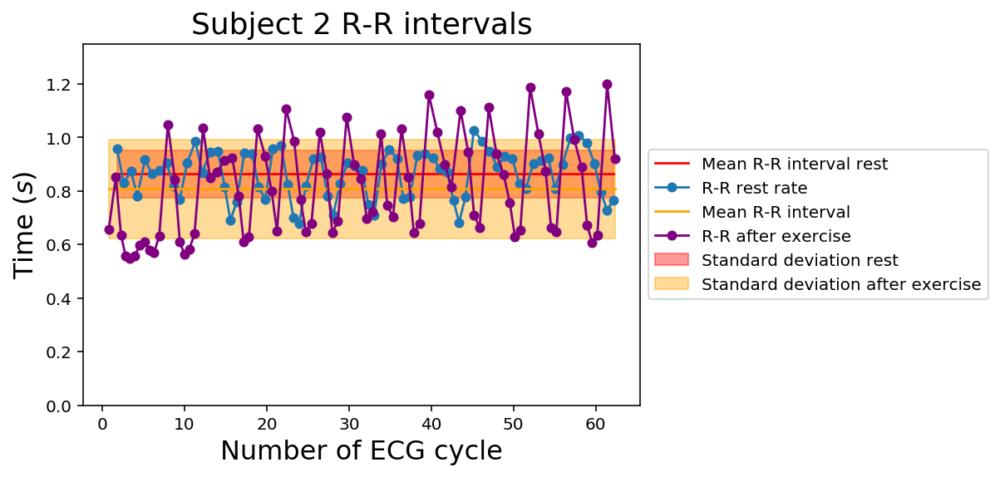

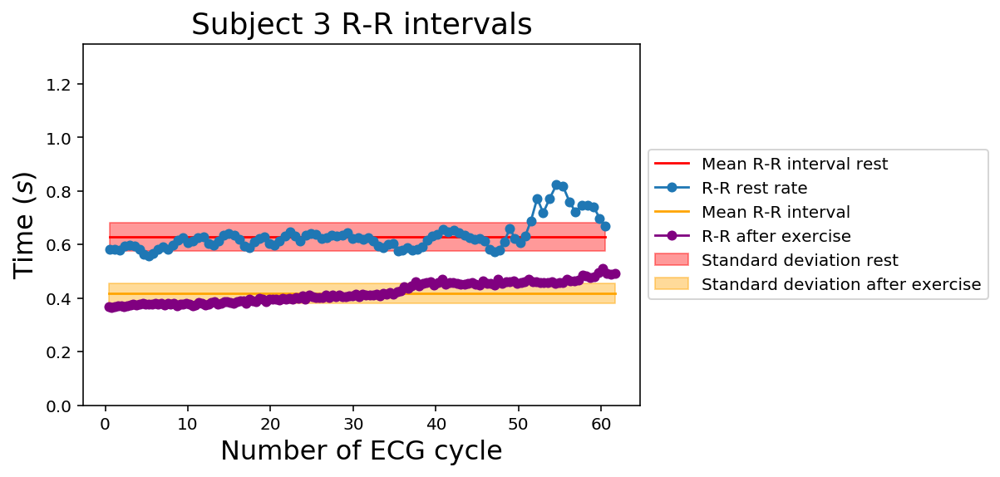

In [10]:
for i in [0, 1, 2]:
    #Rest
    mean_rr_rest = np.mean(subjects[i].xx_rest)
    stdev_rest = stdev(subjects[i].xx_rest)
    
    mean_vec_rest = [mean_rr_rest for i in range(0, len(subjects[i].timeRpeaks_rest)-1)]
    std_vec_plus_rest = [mean_rr_rest + stdev_rest for i in range(0, len(subjects[i].timeRpeaks_rest)-1)]
    std_vec_minus_rest = [mean_rr_rest - stdev_rest for i in range(0, len(subjects[i].timeRpeaks_rest)-1)]
        
    #Exercise
    mean_rr_exer = np.mean(subjects[i].xx_exer)
    stdev_exer = stdev(subjects[i].xx_exer)
    
    mean_vec_exer = [mean_rr_exer for i in range(0, len(subjects[i].timeRpeaks_exer)-1)]
    std_vec_plus_exer = [mean_rr_exer + stdev_exer for i in range(0, len(subjects[i].timeRpeaks_exer)-1)]
    std_vec_minus_exer = [mean_rr_exer - stdev_exer for i in range(0, len(subjects[i].timeRpeaks_exer)-1)]
    
    
    plt.fill_between(subjects[i].timeRpeaks_rest[1:], std_vec_minus_rest,
                     std_vec_plus_rest, facecolor="red",
                     label = "Standard deviation rest", color='red', alpha=0.4)
    plt.plot(subjects[i].timeRpeaks_rest[1:], mean_vec_rest,
             c="r", label = "Mean R-R interval rest")
    plt.plot(subjects[i].timeRpeaks_rest[1:], subjects[i].xx_rest,
             markersize=5, marker = "o", label="R-R rest rate")

    plt.fill_between(subjects[i].timeRpeaks_exer[1:], std_vec_minus_exer,
                     std_vec_plus_exer, facecolor="orange",
                     label = "Standard deviation after exercise", color='orange', alpha=0.4)
    plt.plot(subjects[i].timeRpeaks_exer[1:], mean_vec_exer,
             c="orange", label = "Mean R-R interval")
    plt.plot(subjects[i].timeRpeaks_exer[1:], subjects[i].xx_exer,
             markersize=5, c="purple", marker = "o", label="R-R after exercise")

    plt.ylim((0, 1.35))
    plt.title("Subject "+str(i+1)+" R-R intervals")
    plt.xlabel(r'Number of ECG cycle')
    plt.ylabel(r'Time ($s$)')
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()

Notice that subject 2 has overlapping R-R intervals, but the R peak detection was done correctly. One interpretation is that this subject's heart did not change its dynamic at rest or after performing exercise. Nevertheless, the standard deviation grew after doing exercise.

In subjects 1 and 3 there is a clear difference between the rest and after exercise ECGs.

### Exercise:
Analyze the previous graph, what can you say about the R-R intervals? Think about the statistical measures and electrophiological ones.

# QRS complexes

We will run the following code in the first subject because it is the recording that works. If you try to run the following code with the recordings of subjects 2 and 3, a bad detection of the QRS complex will occur or it will not run. Do not bother running the following cells with the recordings of other subjects because it is based on a good R peak detection.

Mean in seconds of the QRS complex:  0.06154625184973973


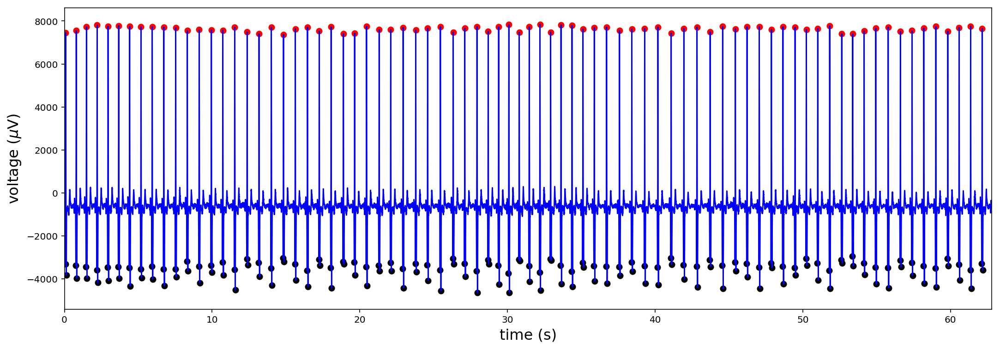

In [14]:
n = 0
mins_rest = local_mins(subjects[n].waveData_rest, subjects[n].mxs_indices_rest)

# What are the lengths of these QRS complexes?
qrs_length_rest = np.zeros(len(subjects[n].mxs_indices_rest)-1)

for j in range(0, len(subjects[n].mxs_indices_rest)-1):
    qrs_length_rest[j] = subjects[n].timeECG_rest[mins_rest[2*j + 1]] - subjects[0].timeECG_rest[mins_rest[2*j]]
    
mean_qrs_rest = np.mean(qrs_length_rest)
print("Mean in seconds of the QRS complex: ",mean_qrs_rest)

vec_length_rest = len(qrs_length_rest)
std_plus_rest = mean_qrs_rest + stdev(qrs_length_rest)
std_minus_rest = mean_qrs_rest - stdev(qrs_length_rest)

mean_vec_rest = [mean_qrs_rest for i in range(0, vec_length_rest)]
std_vec_plus_rest = [std_plus_rest for i in range(0, vec_length_rest)]
std_vec_minus_rest = [std_minus_rest for i in range(0, vec_length_rest)]

# Plotting
plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(min(subjects[n].timeECG_rest), max(subjects[n].timeECG_rest))
plt.plot(subjects[n].timeECG_rest, subjects[n].waveData_rest, 'b')
plt.scatter(subjects[n].timeECG_rest[subjects[n].mxs_indices_rest],
            subjects[n].waveData_rest[subjects[n].mxs_indices_rest], color='r')
plt.scatter(subjects[n].timeECG_rest[mins_rest], subjects[n].waveData_rest[mins_rest], color='k')
plt.show()

Mean in seconds of the QRS complex:  0.05079304163882738


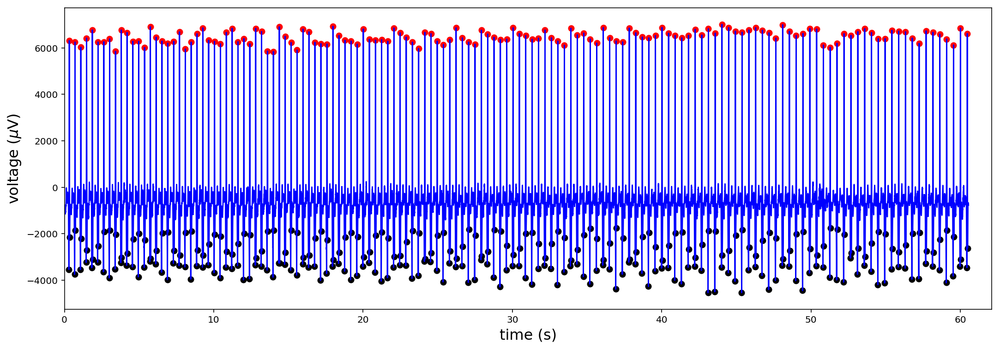

In [15]:
mins_exer = local_mins(subjects[n].waveData_exer, subjects[n].mxs_indices_exer)

# What are the lengths of these QRS complexes?
qrs_length_exer = np.zeros(len(subjects[n].mxs_indices_exer)-1)

for j in range(0, len(subjects[n].mxs_indices_exer)-1):
    qrs_length_exer[j] = subjects[n].timeECG_exer[mins_exer[2*j + 1]] - subjects[n].timeECG_exer[mins_exer[2*j]]

mean_qrs_exer = np.mean(qrs_length_exer)
print("Mean in seconds of the QRS complex: ", mean_qrs_exer)

vec_length_exer = len(qrs_length_exer)
std_plus_exer = mean_qrs_exer + stdev(qrs_length_exer)
std_minus_exer = mean_qrs_exer - stdev(qrs_length_exer)

mean_vec_exer = [mean_qrs_exer for i in range(0, vec_length_exer)]
std_vec_plus_exer = [std_plus_exer for i in range(0, vec_length_exer)]
std_vec_minus_exer = [std_minus_exer for i in range(0, vec_length_exer)]

# Plotting the exercise
plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(min(subjects[n].timeECG_exer),max(subjects[i].timeECG_exer))
#     plt.xlim(0, 4)
plt.plot(subjects[n].timeECG_exer, subjects[n].waveData_exer, 'b')
plt.scatter(subjects[n].timeECG_exer[subjects[n].mxs_indices_exer],
            subjects[n].waveData_exer[subjects[n].mxs_indices_exer], color='r')
plt.scatter(subjects[n].timeECG_exer[mins_exer], subjects[n].waveData_exer[mins_exer], color='k')
plt.show()

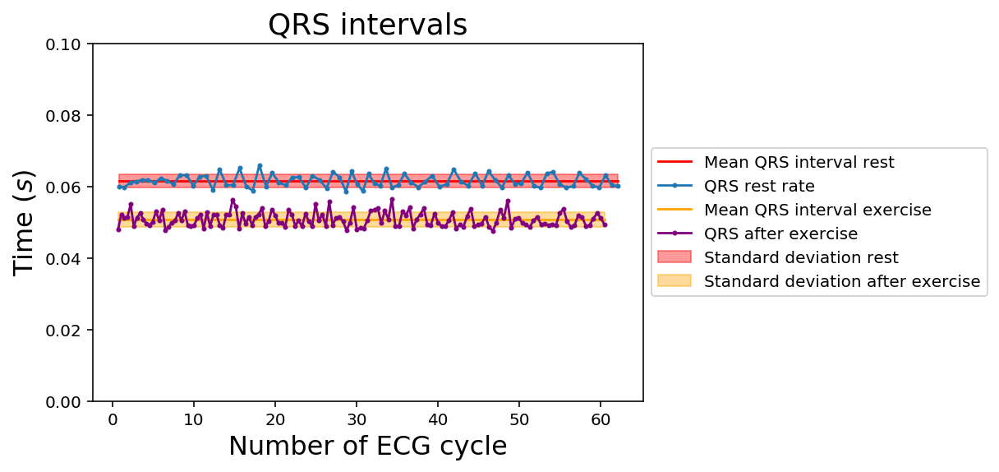

In [16]:
plt.fill_between(subjects[n].timeRpeaks_rest[1:], std_vec_minus_rest, std_vec_plus_rest, facecolor="red",
                 label = "Standard deviation rest", color='red', alpha=0.4)
plt.plot(subjects[n].timeRpeaks_rest[1:], mean_vec_rest, c="r", label = "Mean QRS interval rest")
plt.plot(subjects[n].timeRpeaks_rest[1:], qrs_length_rest, markersize=2, marker = "o", label="QRS rest rate")

plt.fill_between(subjects[n].timeRpeaks_exer[1:], std_vec_minus_exer, std_vec_plus_exer, facecolor="orange",
                 label = "Standard deviation after exercise", color='orange', alpha=0.4)
plt.plot(subjects[n].timeRpeaks_exer[1:], mean_vec_exer, c="orange", label = "Mean QRS interval exercise")
plt.plot(subjects[n].timeRpeaks_exer[1:], qrs_length_exer, markersize=2, c="purple", marker = "o", label="QRS after exercise")

plt.ylim((0, 0.1))
plt.title("QRS intervals")
plt.xlabel(r'Number of ECG cycle')
plt.ylabel(r'Time ($s$)')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

### Exercise: Why are we observing a change in the QRS interval? Is it not a constant value? Think baout electrophysiology and the sampling rate of this recording.

# Poincaré plots

We already have the ``mxs_indices`` which correspond to the R-peaks, and ``xx`` corresponds to the R intervals. With this information, we can make a plot where we compare each one of these peaks to the next one. As this technique uses the R-R interval time series, we will only use recordings of subjects 1, 2 and 3.

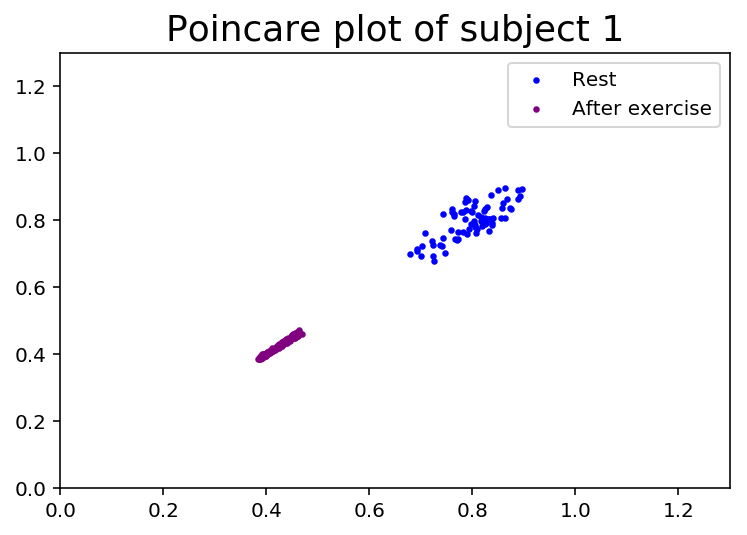

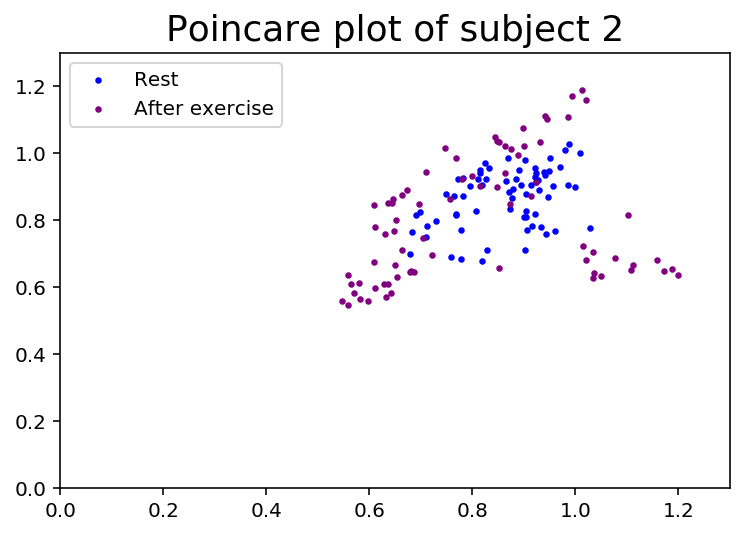

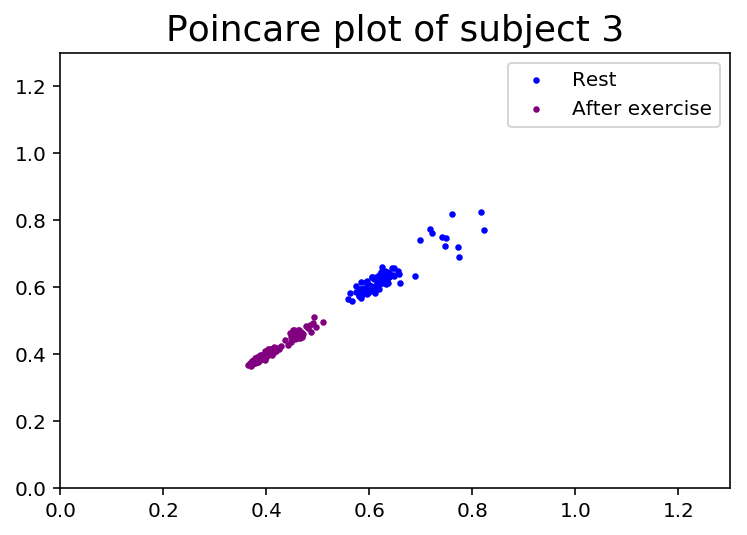

In [26]:
for i in [0, 1, 2]:
    plt.scatter(subjects[i].xx_rest[1:-1], subjects[i].xx_rest[:-2],
                s = 5, c = "blue", label = "Rest")
    plt.scatter(subjects[i].xx_exer[1:-1], subjects[i].xx_exer[:-2],
                s = 5, c ="purple", label = "After exercise")
    plt.title("Poincare plot of subject "+str(i+1))
    plt.xlim(0,1.3)
    plt.ylim(0,1.3)
    plt.legend()
    plt.show()

Notice subjects 1 and 3. Even without the colors, we are able to identify which points belong to the rest cluster and to the after exercise cluster. This pattern arises when the heart is under stress. The separaration between the dots is less and they tend to move towards the origin. We could explain this phenomena because after exercise, more oxygen is being distributed around the body, so the heart must pump at a faster rate. This makes the heart pump in a more regular pattern.

Now let's look at subject 2. There are no two distinguishable clusters of points, only one big cloud. This is a strange pattern because there are two main characteristics we must look for: points lying near the identity and two discernible groups (one for the after exercise data and one for the rest data). As none of these characteristics are seen in the previous figure, we could speculate that subject 2 could have an arrythmia, but a specialist in this area must take a look at this case.

Note: By identity I mean the function $f(x)=x$.

Are you curious to know what would we see in this technique with a bad R-peak selection? Let's find out!

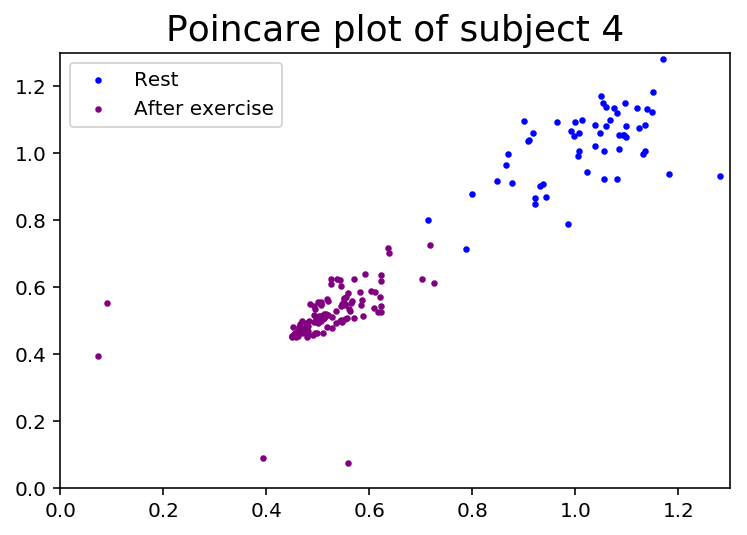

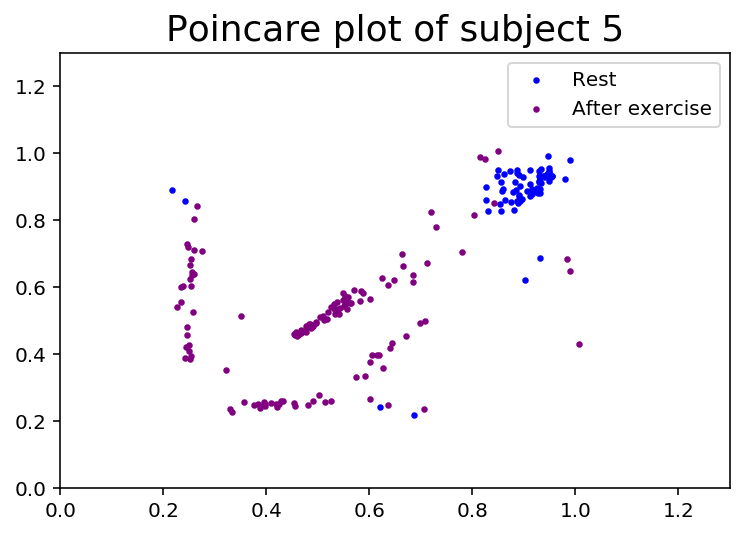

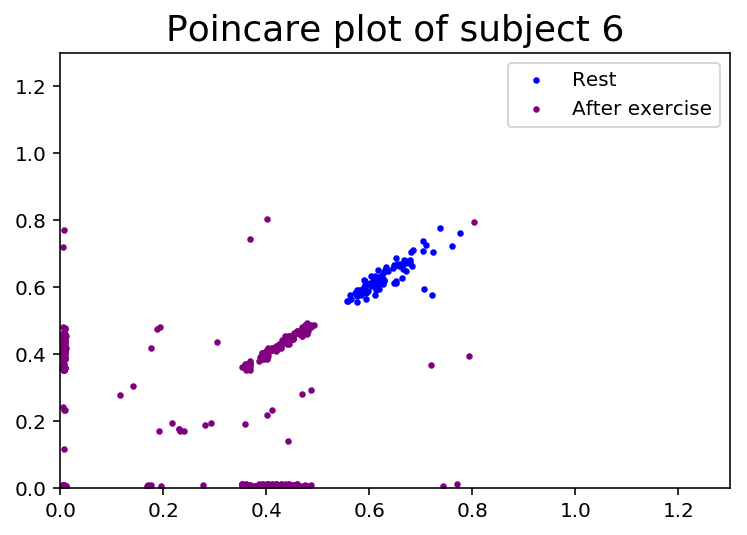

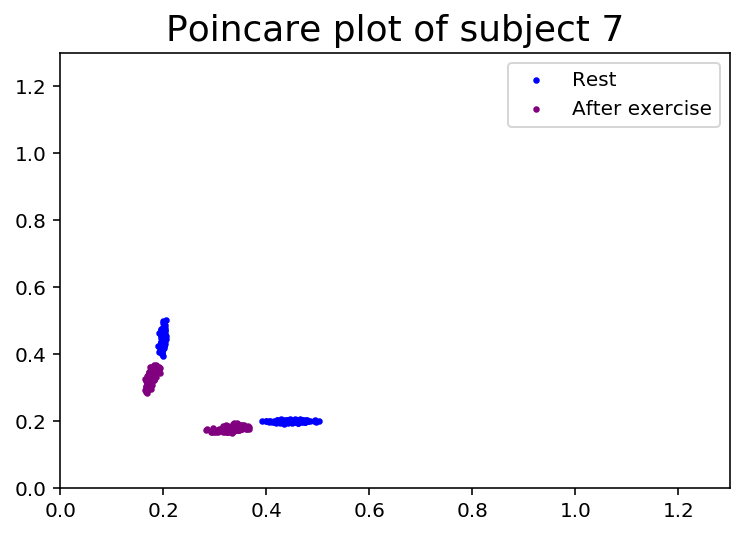

In [29]:
for i in [3,4,5,6]:
    plt.scatter(subjects[i].xx_rest[1:-1], subjects[i].xx_rest[:-2],
                s = 5, c = "blue", label = "Rest")
    plt.scatter(subjects[i].xx_exer[1:-1], subjects[i].xx_exer[:-2],
                s = 5, c ="purple", label = "After exercise")
    plt.title("Poincare plot of subject "+str(i+1))
    plt.xlim(0,1.3)
    plt.ylim(0,1.3)
    plt.legend()
    plt.show()

What patterns can we observe when there is a bad R peak detection? First, we observe these isolated points that do not lie near the identity in subject 4. In subject 5 we also see point lying far away from the identity. In subject 6, there are dots that lie in the X or Y axis. This does not make sense, because it would mean that one point has no relationship to the next. Finally, with subject 7 we observe a kind of butterfly pattern, symmetric along the identity, but due to a bad R peak detection.

### Exercise: Compare the two patterns (purple and blue dots). Why do we see the points getting closer and near the origin after performing exercise?

# Phase space reconstruction

In the previos technique we only compared the R intervals with the next interval. What would happen if we compare not the R interval, but the whole recording with a certain time delay we choose. Instead of comparing one data point with its next in time, we choose an arbitrary time delay? In other words, we are going to generalize what we applied in the previous technique with the whole ECG data series and with an arbitrary time delay.

In [34]:
#Generating a function that will reconstruct the phase space for a certain time delay
# data_series is the voltage of our signal
# period is the time delay
# identifier is a string that will help us identify that particular graph

def graph_phase_space(waveData, period = 210, identifier = "xx"):
    time = period*0.1 #time is in miliseconds
    n = np.size(waveData) #size of the voltage vector
    
    plt.figure(2)
    plt. plot(waveData[0: n-period], waveData[period: n],
              marker = "o", markersize = 0.05, linewidth = 0.005, color = "black")
    plt.title(identifier+r": $t+"+str(time)+"ms$")
    plt.xlabel(r"$x_n$")
    y = r'$x_{n+'+str(time)+"ms}$"
    plt.ylabel(y)
    plt.show()
    return None

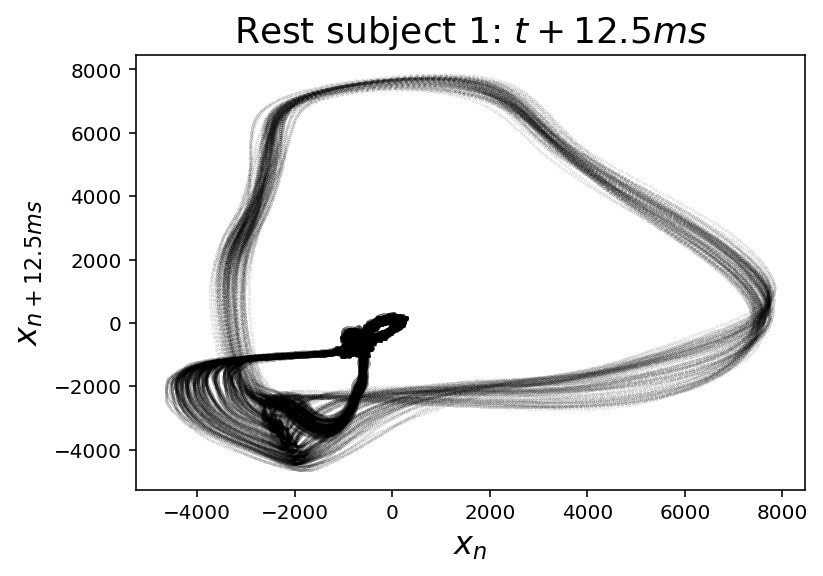

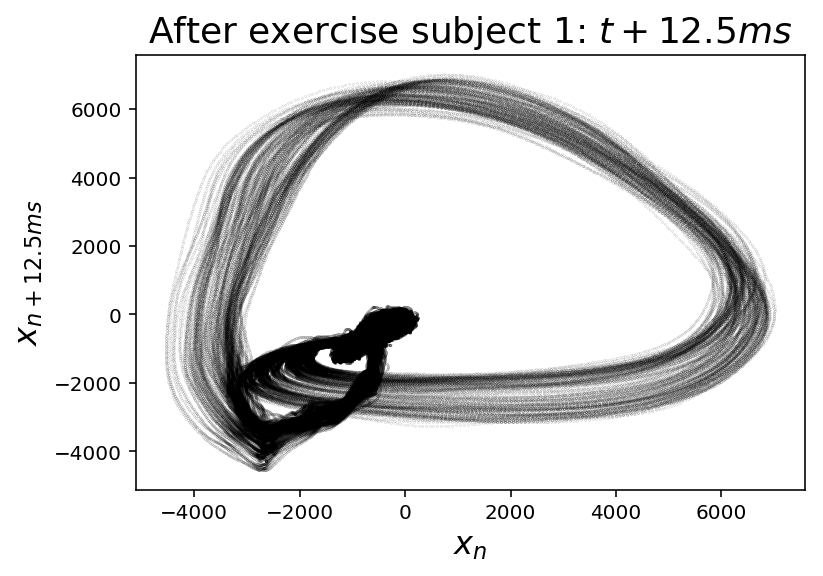

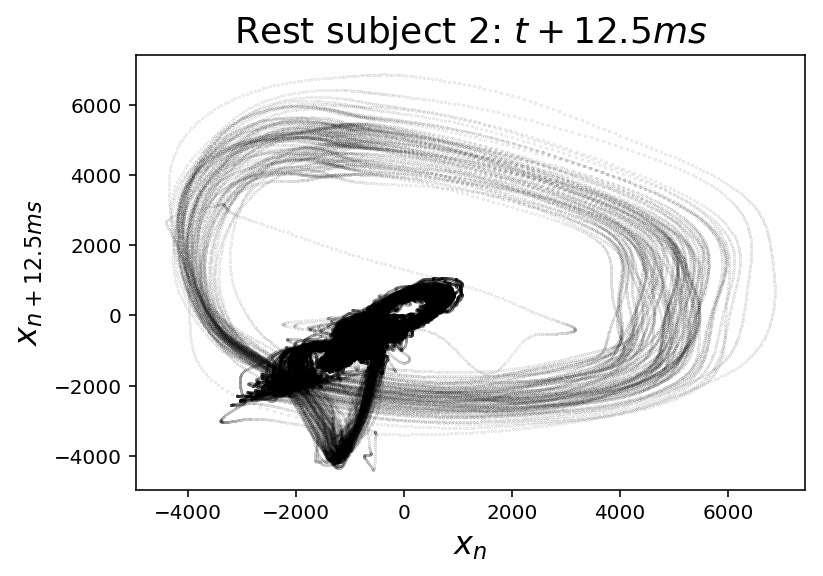

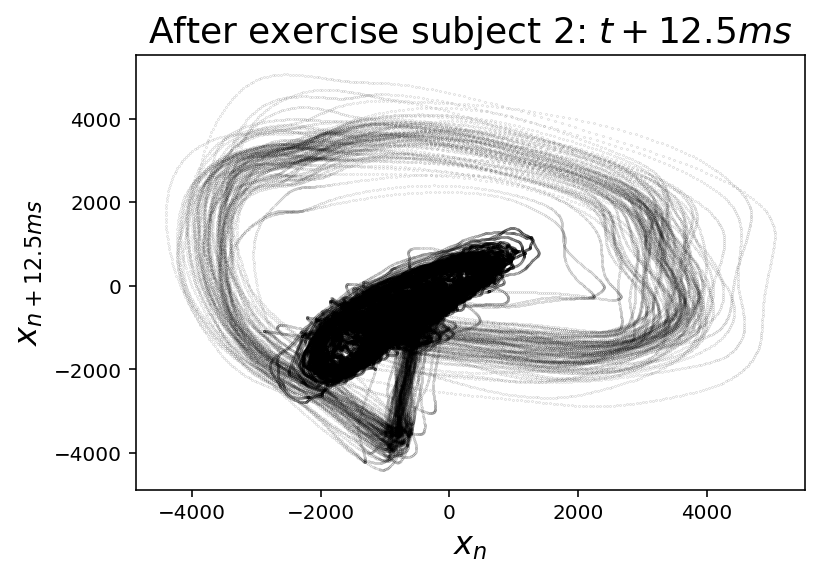

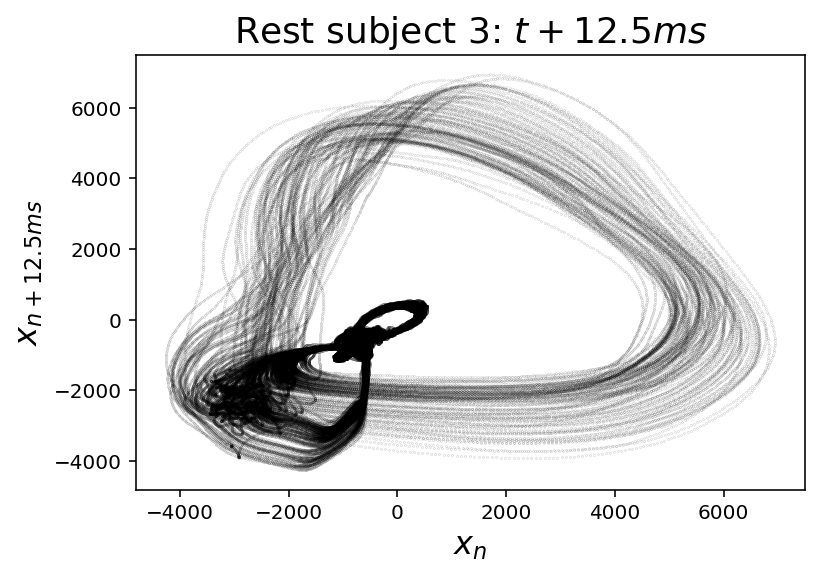

...

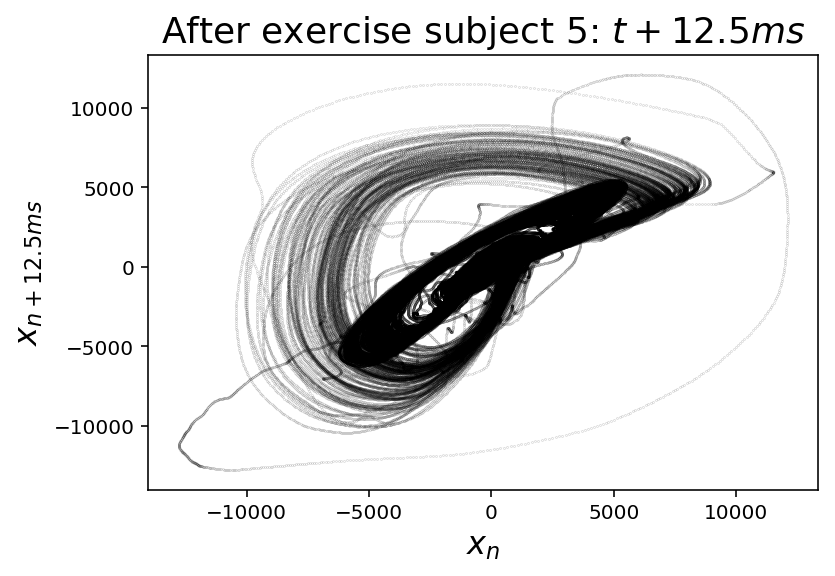

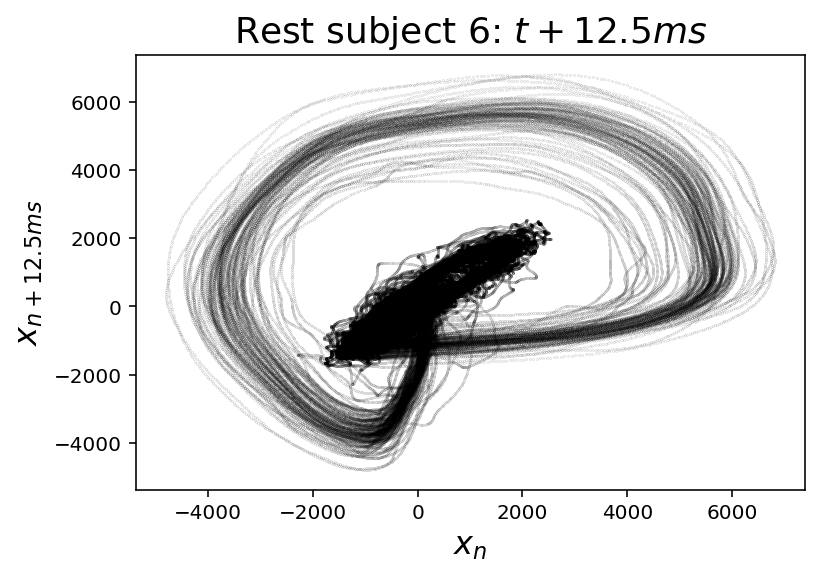

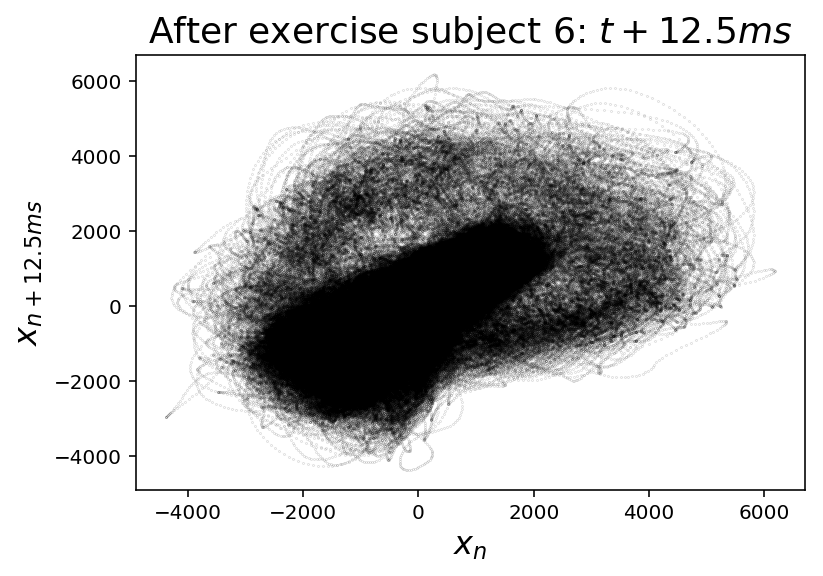

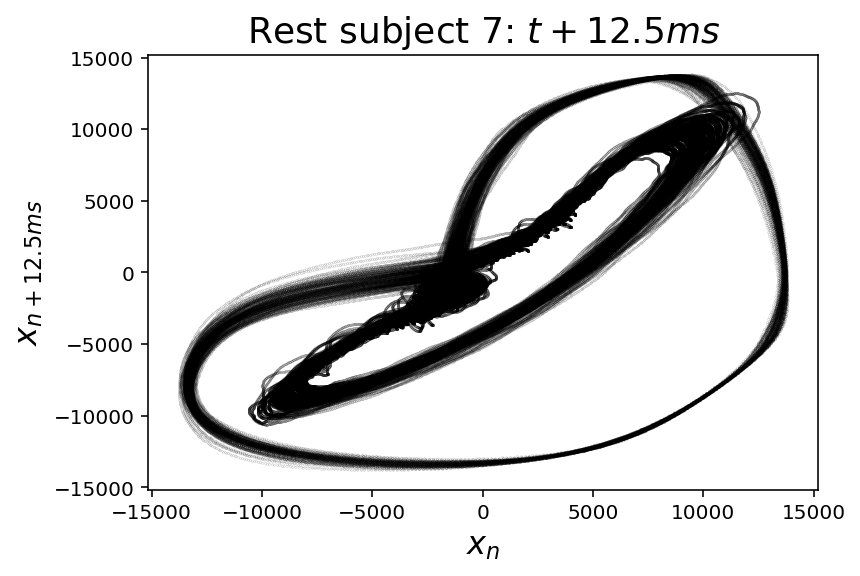

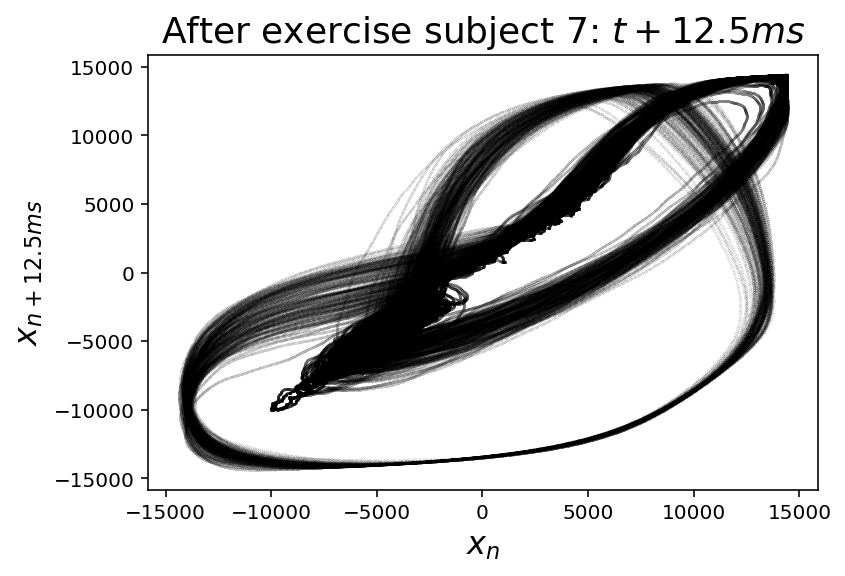

In [35]:
time_delay = 125 #12.5 ms

for i in range(0, 7):
    identifier_rest = "Rest subject "+str(i+1)
    identifier_exer = "After exercise subject "+str(i+1)
    graph_phase_space(subjects[i].waveData_rest, time_delay, identifier_rest)
    graph_phase_space(subjects[i].waveData_exer, time_delay, identifier_exer)

Notice how the trajectory in phase space seems to spread out after the exercise period. Also notice that the reconstructed phase space looks different for the different individuals. While the cycle seems to unfold in the first 6 subjects in the top two quadrants of the cartesian plane, in subject 7, this dynamic is observed in the two bottom quadrants. Another aspect we observe here is that it is not easy to detect problems in the recording when observing the reconstructed phase space.

### Exercise: Compare reconstructed phase space of subject 1 after doing exercise and subject 6 at rest. Is it valid to compare these two plots? Explain. Hint: Think about personalized medicine.

### Exercise: Choose another time delay and make the graphs. By observing the graphs, could you be able to identify when an individual is at rest and when they just did exercise?

### Exercise: Are the results obtained in a Poincaré plot and in a recurrence plot contradictory? While we are observing a loss in the first plot's variability with exercise, we are seeing the opposite in a recurrence plot. Why?

# Recurrence plots

This is a technique which compares every single data point to every other. Because of this reason, it is a very expensive algorithm computationaly. To reduce this computational time, we must create a surrogate data set. Be sure to create a surrogate data set that includes at least two QRS complexes.

In the following cell, change the start and end values to obtain two QRS complexes.

In [37]:
# Function for creating the surrogate time series
def surrogate(timeECG, waveData, start, end):
    surrogate = [waveData[start+i*5] for i in range(0, int((end-start)/5))]
    time_surrogate = [timeECG[start+i*5] for i in range(0, int((end-start)/5))]
    
    print("Sampling rate of ", len(waveData)/timeECG[-1],
          " points per second got reduced to ", len(time_surrogate)/time_surrogate[-1],
         " points per second.")
    
    print("Time series of ",len(timeECG[start:end])," got reduced to ",len(time_surrogate))
    
    return [time_surrogate, surrogate]

# Heat map Recurrence plot
def recurrence_plot(surrogate, data_point_delay = 25):
    n = len(surrogate)
    euclid = np.zeros((n,n), dtype = 'float')
    normal_euclid = np.zeros((n,n), dtype = 'float')

    #Cycle for obtaining the euclid distance between any two points
    for i in range(0, n-data_point_delay):
        for j in range(data_point_delay, n):
            euclid[i][j] = np.sqrt(np.abs(surrogate[i]**2 - surrogate[j]**2)) #euclidian norm

    normal_aux = np.max(euclid)

    # Cycle for normalizing the distance
    for i in range(0, n-data_point_delay):
        for j in range(data_point_delay, n):
            normal_euclid[i][j] = np.abs(euclid[i][j]/normal_aux-1)
            #Normalizing the values, and the farthest points have the lowest value (0),
            #while the nearest points have a value near 1

    return normal_euclid

def graph_recurrence(surrogate_data, index_surrogate, normal_euclid):
    
    #Initializing the graphic space
    fig = plt.figure(figsize=(6,8))
    gs = mpl.gridspec.GridSpec(2, 2, height_ratios=[1, 1], width_ratios=[2, 1])
    ax1 = fig.add_subplot(gs[1, 0])
    ax2 = fig.add_subplot(gs[0, 0], sharex=ax1)
    plt.tick_params(which='both', top=False, right=False)
    ax2.set_autoscalex_on(False)

    # Electrocardiogram
    ax1.set_title("Electrocardiogram")
    ax1.set_ylabel('Voltage')
    ax1.set_xlabel('Index')
    ax1.set_xlim(0, len(surrogate_data))
    ax1.plot(index_surrogate, surrogate_data, marker="o", c="k") #index_surrogate or time_surrogate (ms)

    # Recurrence plot
    ax2.set_title("Recurrence plot")
    plot = ax2.imshow(normal_euclid, origin='lower', aspect="auto", cmap="jet")
    axins = inset_axes(ax2,
                   width="5%", # width = 10% of parent_bbox width
                   height="100%", # height : 50%
                   loc=6,
                   bbox_to_anchor=(1.05, 0., 1, 1),
                   bbox_transform=ax2.transAxes,
                   borderpad=0,)

    cbar = plt.colorbar(plot, cax=axins)
    plt.show()
    return None

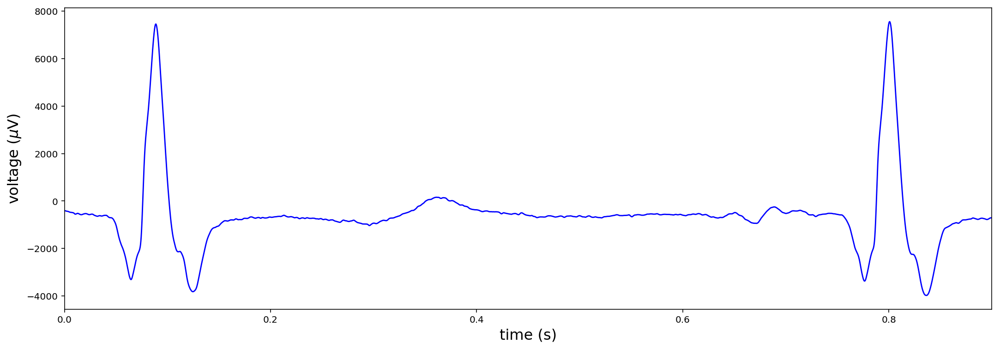

Sampling rate of  10000.0  points per second got reduced to  2001.1085422545434  points per second.
Time series of  9000  got reduced to  1800


In [39]:
# This cell must be repeated for every recording
start = 0
end = 9000

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[0].timeECG_rest[start], subjects[0].timeECG_rest[end])

plt.plot(subjects[0].timeECG_rest[start:end], subjects[0].waveData_rest[start:end], 'b')
plt.show()

time_surrogate_rest1, surrogate_rest1 = surrogate(subjects[0].timeECG_rest,
                                                  subjects[0].waveData_rest,
                                                  start, end)

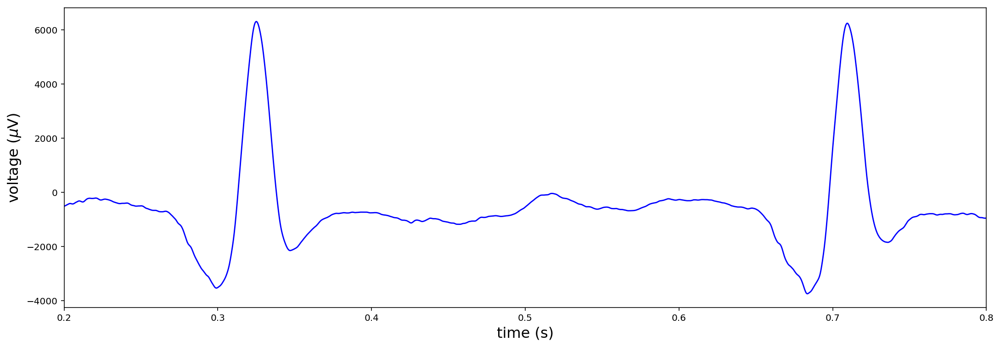

Sampling rate of  10000.0  points per second got reduced to  1500.935607278932  points per second.
Time series of  6000  got reduced to  1200


In [40]:
start = 2000
end = 8000

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[0].timeECG_exer[start], subjects[0].timeECG_exer[end])
plt.plot(subjects[0].timeECG_exer[start:end], subjects[0].waveData_exer[start:end], 'b')
plt.show()

time_surrogate_exer1, surrogate_exer1 = surrogate(subjects[0].timeECG_exer,
                                                  subjects[0].waveData_exer,
                                                  start, end)

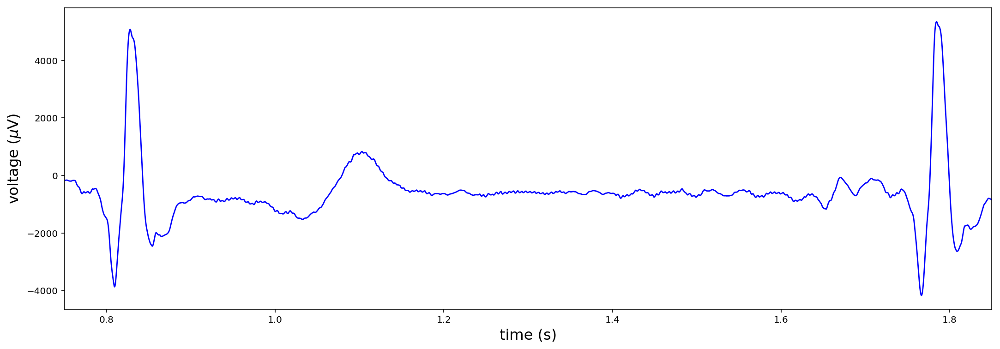

Sampling rate of  10000.0  points per second got reduced to  1189.5087781390694  points per second.
Time series of  11000  got reduced to  2200


In [41]:
# Subject 2
start = 7500
end = 18500

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[1].timeECG_rest[start], subjects[1].timeECG_rest[end])

plt.plot(subjects[1].timeECG_rest[start:end], subjects[1].waveData_rest[start:end], 'b')
plt.show()

time_surrogate_rest2, surrogate_rest2 = surrogate(subjects[1].timeECG_rest,
                                                  subjects[1].waveData_rest,
                                                  start, end)

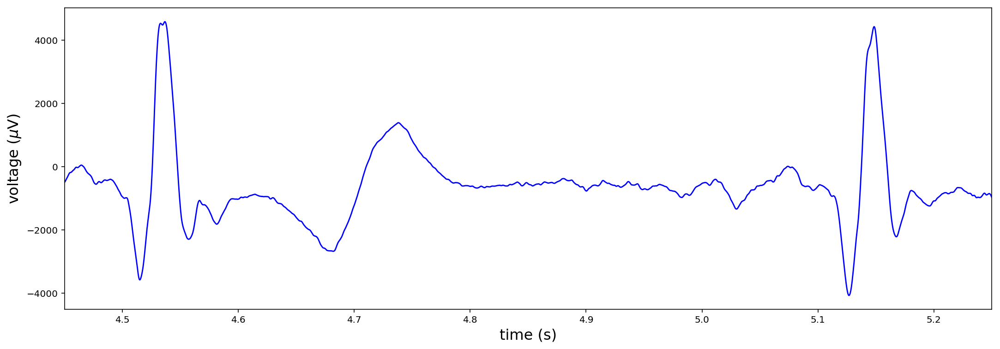

Sampling rate of  10000.0  points per second got reduced to  304.7904448463977  points per second.
Time series of  8000  got reduced to  1600


In [42]:
start = 44500
end = 52500

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[1].timeECG_exer[start], subjects[1].timeECG_exer[end])
plt.plot(subjects[1].timeECG_exer[start:end], subjects[1].waveData_exer[start:end], 'b')
plt.show()

time_surrogate_exer2, surrogate_exer2 = surrogate(subjects[1].timeECG_exer,
                                                  subjects[1].waveData_exer,
                                                  start, end)

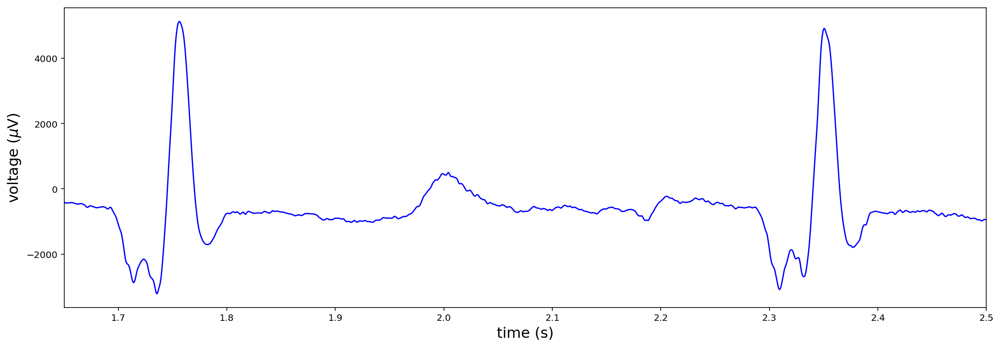

Sampling rate of  10000.0  points per second got reduced to  680.1349040273057  points per second.
Time series of  8500  got reduced to  1700


In [43]:
# Subject 3
start = 16500
end = 25000

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[2].timeECG_rest[start], subjects[2].timeECG_rest[end])
plt.plot(subjects[2].timeECG_rest[start:end], subjects[2].waveData_rest[start:end], 'b')
plt.show()

time_surrogate_rest3, surrogate_rest3 = surrogate(subjects[2].timeECG_rest,
                                                  subjects[2].waveData_rest,
                                                  start, end)

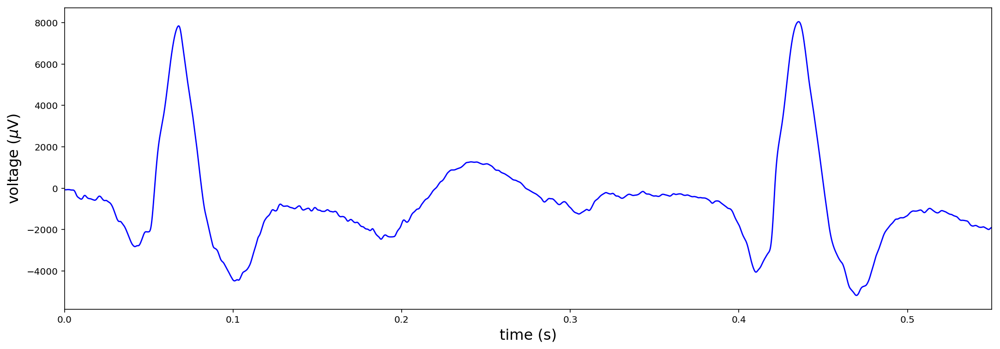

Sampling rate of  10000.0  points per second got reduced to  2001.8166131134967  points per second.
Time series of  5500  got reduced to  1100


In [44]:
start = 0
end = 5500

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[2].timeECG_exer[start], subjects[2].timeECG_exer[end])
plt.plot(subjects[2].timeECG_exer[start:end], subjects[2].waveData_exer[start:end], 'b')
plt.show()

time_surrogate_exer3, surrogate_exer3 = surrogate(subjects[2].timeECG_exer,
                                                  subjects[2].waveData_exer,
                                                  start, end)

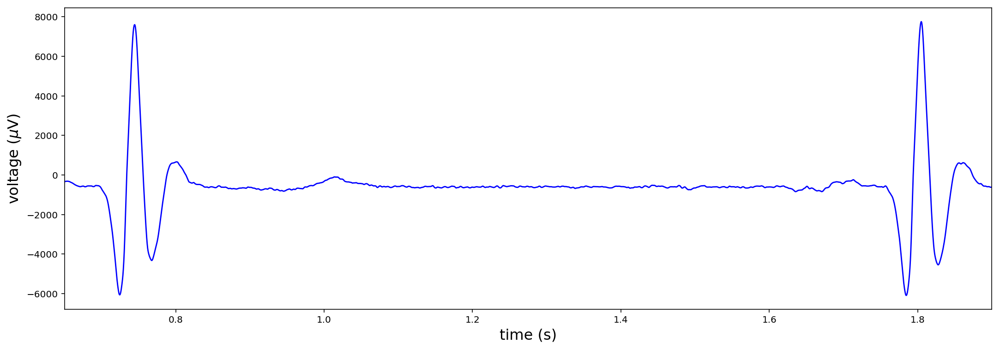

Sampling rate of  10000.0  points per second got reduced to  1316.133680405449  points per second.
Time series of  12500  got reduced to  2500


In [45]:
# Subject 4
start = 6500
end = 19000

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[3].timeECG_rest[start], subjects[3].timeECG_rest[end])
plt.plot(subjects[3].timeECG_rest[start:end], subjects[3].waveData_rest[start:end], 'b')
plt.show()

time_surrogate_rest4, surrogate_rest4 = surrogate(subjects[3].timeECG_rest,
                                                  subjects[3].waveData_rest,
                                                  start, end)

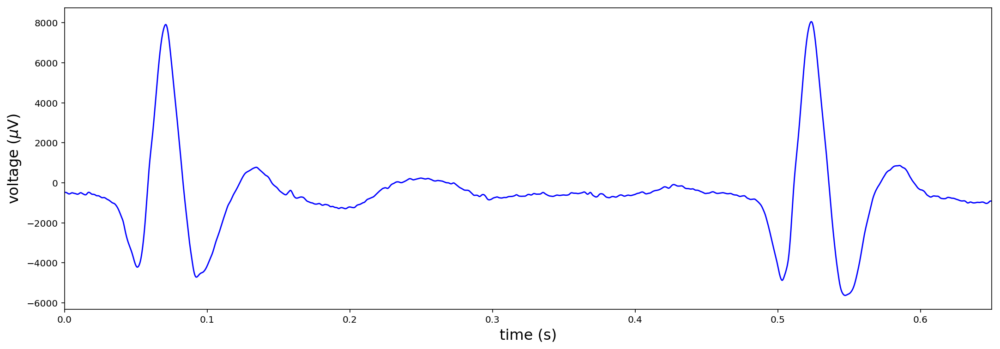

Sampling rate of  10000.0  points per second got reduced to  2001.5367595186165  points per second.
Time series of  6500  got reduced to  1300


In [46]:
start = 0
end = 6500

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[3].timeECG_exer[start], subjects[3].timeECG_exer[end])
plt.plot(subjects[3].timeECG_exer[start:end], subjects[3].waveData_exer[start:end], 'b')
plt.show()

time_surrogate_exer4, surrogate_exer4 = surrogate(subjects[3].timeECG_exer,
                                                  subjects[3].waveData_exer,
                                                  start, end)

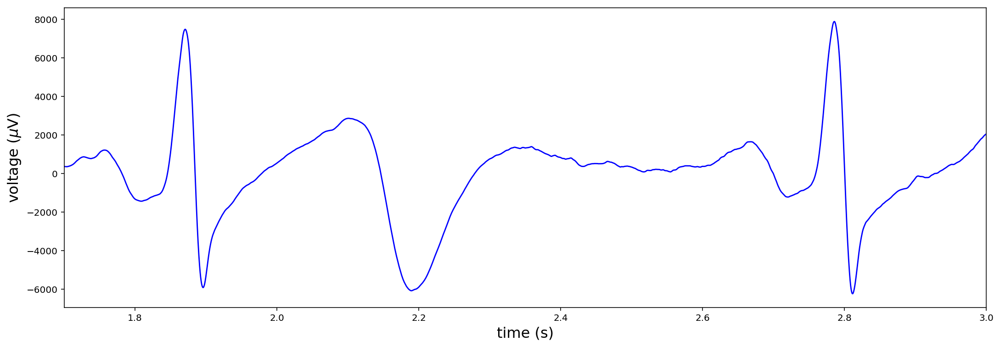

Sampling rate of  10000.0  points per second got reduced to  866.8097625862184  points per second.
Time series of  13000  got reduced to  2600


In [47]:
# Subject 5
start = 17000
end = 30000

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[4].timeECG_rest[start], subjects[4].timeECG_rest[end])
plt.plot(subjects[4].timeECG_rest[start:end], subjects[4].waveData_rest[start:end], 'b')
plt.show()

time_surrogate_rest5, surrogate_rest5 = surrogate(subjects[4].timeECG_rest,
                                                  subjects[4].waveData_rest,
                                                  start, end)

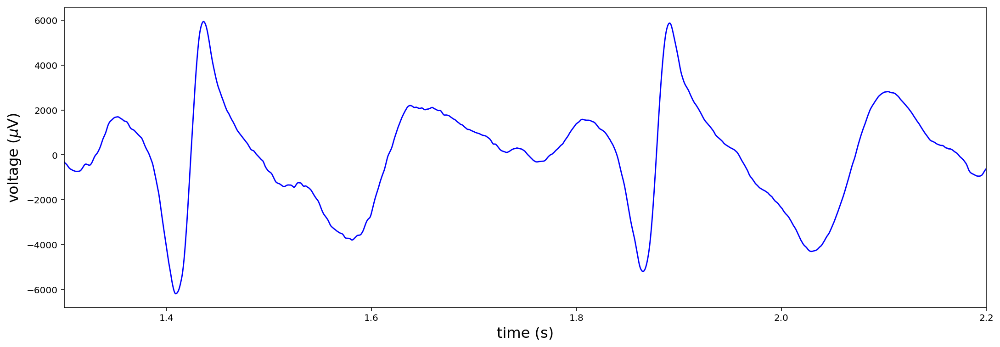

Sampling rate of  10000.0  points per second got reduced to  818.366656625953  points per second.
Time series of  9000  got reduced to  1800


In [48]:
start = 13000
end = 22000
n = 4

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[n].timeECG_exer[start], subjects[n].timeECG_exer[end])
plt.plot(subjects[n].timeECG_exer[start:end], subjects[n].waveData_exer[start:end], 'b')
plt.show()

time_surrogate_exer5, surrogate_exer5 = surrogate(subjects[n].timeECG_exer,
                                                  subjects[n].waveData_exer,
                                                  start, end)

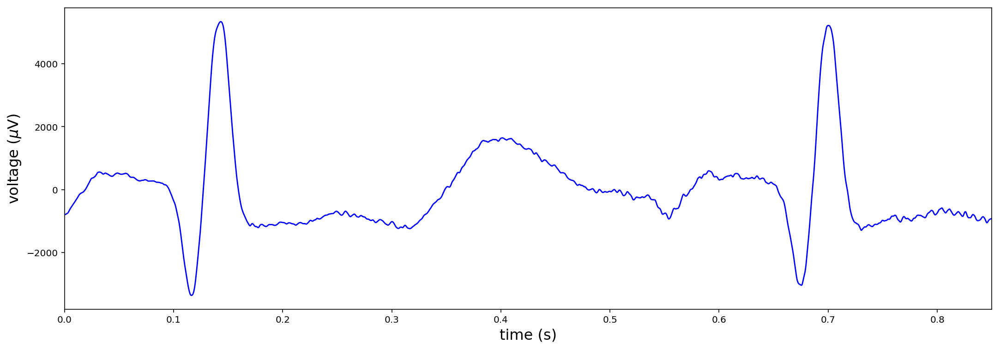

Sampling rate of  10000.0  points per second got reduced to  2001.1738536104933  points per second.
Time series of  8500  got reduced to  1700


In [49]:
# Subject 6
start = 0
end = 8500
n = 5

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[n].timeECG_rest[start], subjects[n].timeECG_rest[end])
plt.plot(subjects[n].timeECG_rest[start:end], subjects[n].waveData_rest[start:end], 'b')
plt.show()

time_surrogate_rest6, surrogate_rest6 = surrogate(subjects[n].timeECG_rest,
                                                  subjects[n].waveData_rest,
                                                  start, end)

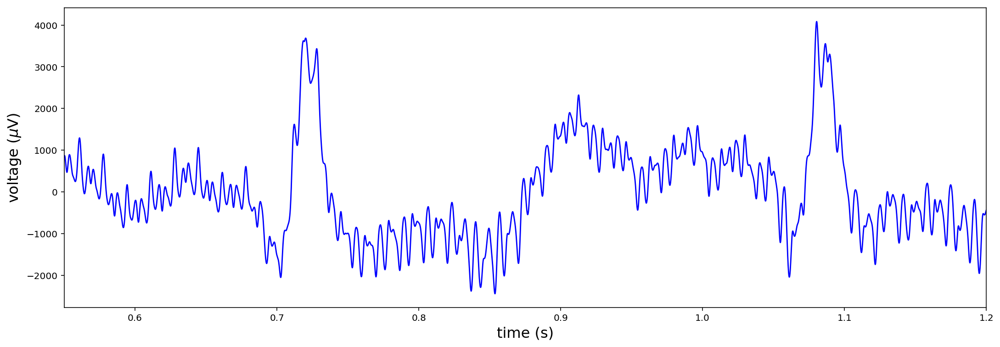

Sampling rate of  10000.0  points per second got reduced to  1083.783905539644  points per second.
Time series of  6500  got reduced to  1300


In [50]:
start = 5500
end = 12000
n = 5

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[n].timeECG_exer[start], subjects[n].timeECG_exer[end])
plt.plot(subjects[n].timeECG_exer[start:end], subjects[n].waveData_exer[start:end], 'b')
plt.show()

time_surrogate_exer6, surrogate_exer6 = surrogate(subjects[n].timeECG_exer,
                                                  subjects[n].waveData_exer,
                                                  start, end)

Notice that this recording presents a lot of 60 Hz noise.

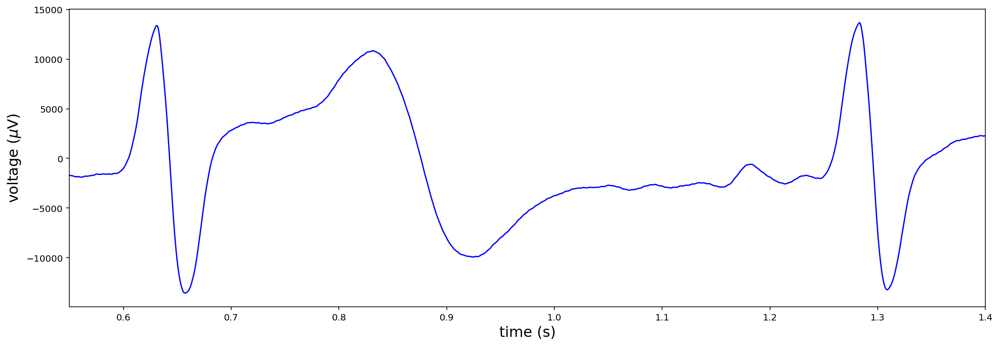

Sampling rate of  10000.0  points per second got reduced to  1214.7178047061686  points per second.
Time series of  8500  got reduced to  1700


In [55]:
# Subject 7
start = 5500
end = 14000
n = 6

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[n].timeECG_rest[start], subjects[n].timeECG_rest[end])
plt.plot(subjects[n].timeECG_rest[start:end], subjects[n].waveData_rest[start:end], 'b')
plt.show()

time_surrogate_rest7, surrogate_rest7 = surrogate(subjects[n].timeECG_rest,
                                                  subjects[n].waveData_rest,
                                                  start, end)

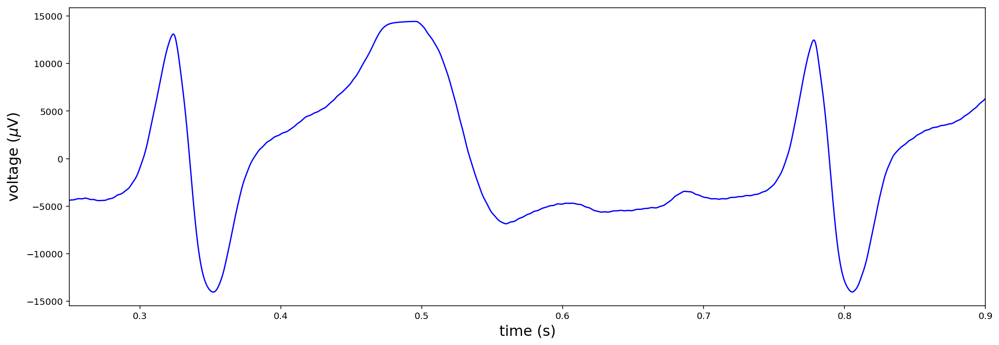

Sampling rate of  10000.0  points per second got reduced to  1445.2452154875803  points per second.
Time series of  6500  got reduced to  1300


In [59]:
start = 2500
end = 9000
n = 6

plt.figure(figsize=(18,6))
plt.xlabel(r'time (s)')
plt.ylabel(r'voltage ($\mu$V)')
plt.xlim(subjects[n].timeECG_exer[start], subjects[n].timeECG_exer[end])
plt.plot(subjects[n].timeECG_exer[start:end], subjects[n].waveData_exer[start:end], 'b')
plt.show()

time_surrogate_exer7, surrogate_exer7 = surrogate(subjects[n].timeECG_exer,
                                                  subjects[n].waveData_exer,
                                                  start, end)

In [60]:
time_exer_surrogates = [time_surrogate_exer1, time_surrogate_exer2,
                        time_surrogate_exer3, time_surrogate_exer4,
                        time_surrogate_exer5, time_surrogate_exer6,
                        time_surrogate_exer7]
waveData_exer_surrogates = [surrogate_exer1, surrogate_exer2, surrogate_exer3,
                            surrogate_exer4, surrogate_exer5, surrogate_exer6,
                            surrogate_exer7]

time_rest_surrogates = [time_surrogate_rest1, time_surrogate_rest2,
                        time_surrogate_rest3, time_surrogate_rest4,
                        time_surrogate_rest5, time_surrogate_rest6,
                        time_surrogate_rest7]
waveData_rest_surrogates = [surrogate_rest1, surrogate_rest2, surrogate_rest3,
                            surrogate_rest4, surrogate_rest5, surrogate_rest6,
                            surrogate_rest7]

Now we will reconstruct the attractor just like in the previous exercise, but only with this surrogate tiem series. First, we choose a delay just like in the previous exercise, for example $delay=12.5 ms$. We must find the number of data poitns that correspond to this time delay.

In [71]:
data_point_delay = 25
for i in range(0, 7):
    print("Subject "+str(i+1))
    delay_rest = time_rest_surrogates[i][data_point_delay]-time_rest_surrogates[i][0]
    print("Rest "+str(delay_rest))
    delay_exer = time_exer_surrogates[i][data_point_delay]-time_exer_surrogates[i][0]
    print("After exercise "+str(delay_exer))

Subject 1
Rest 0.012500019904490293
After exercise 0.012500020645664245
Subject 2
Rest 0.012500019970667076
After exercise 0.012500019998303635
Subject 3
Rest 0.012500020642561616
After exercise 0.012500020126102105
Subject 4
Rest 0.012500020370382448
After exercise 0.012500018025916944
Subject 5
Rest 0.01250001979389026
After exercise 0.012500017630241667
Subject 6
Rest 0.012500020671783347
After exercise 0.012500011589483773
Subject 7
Rest 0.012500017884685244
After exercise 0.012500018544920999


Perfect! Now let's reconstruct the attractor.

Subject1


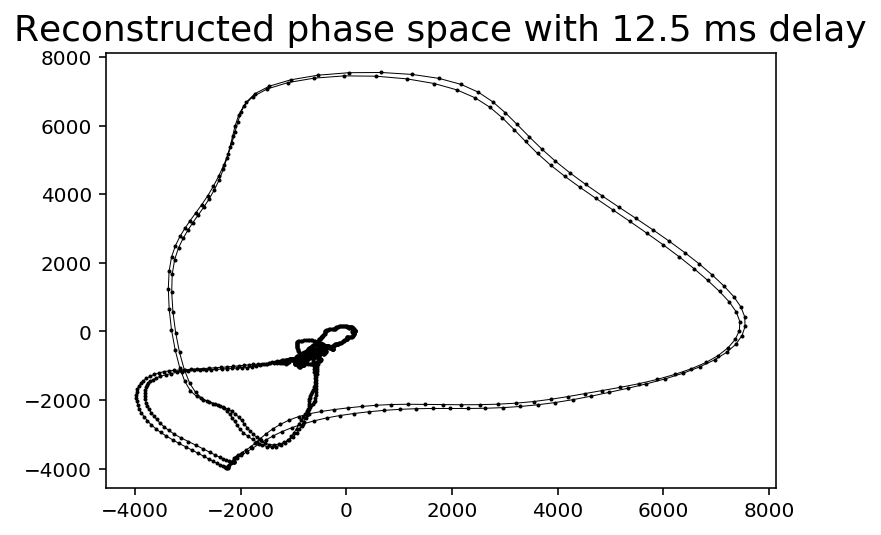

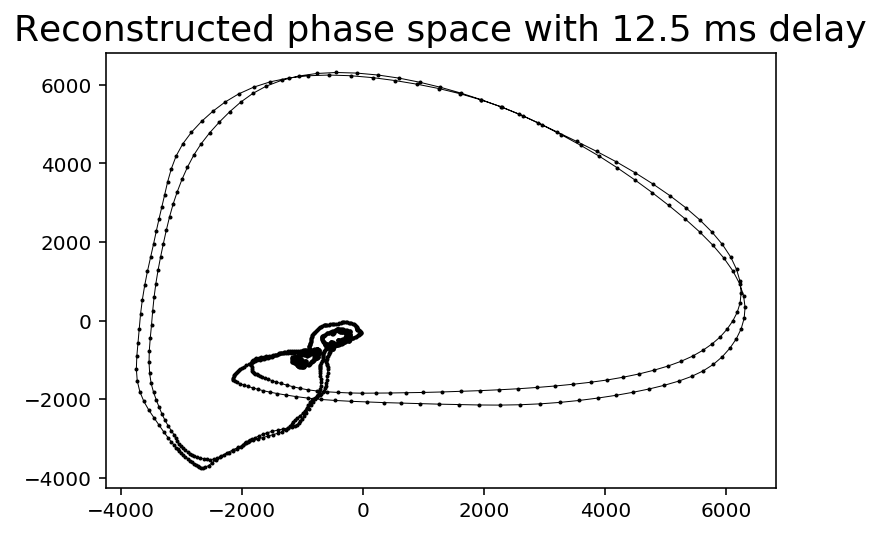

Subject2


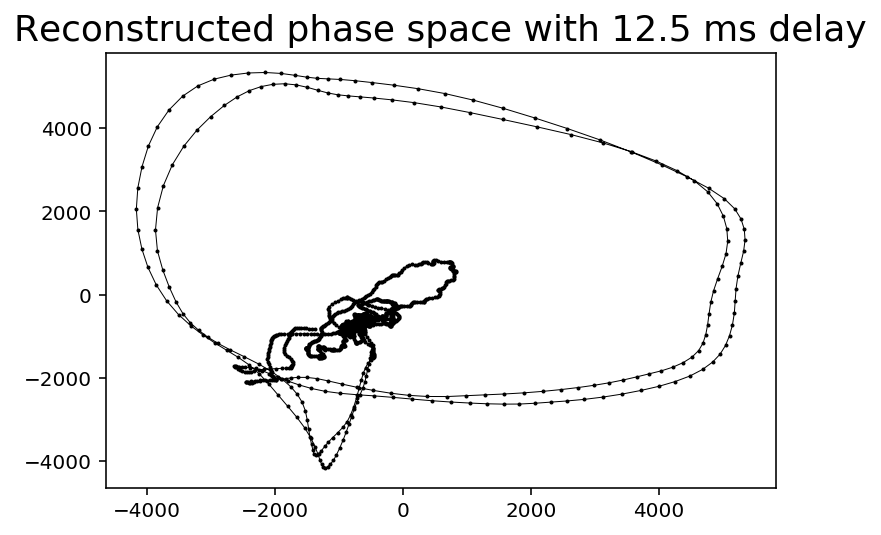

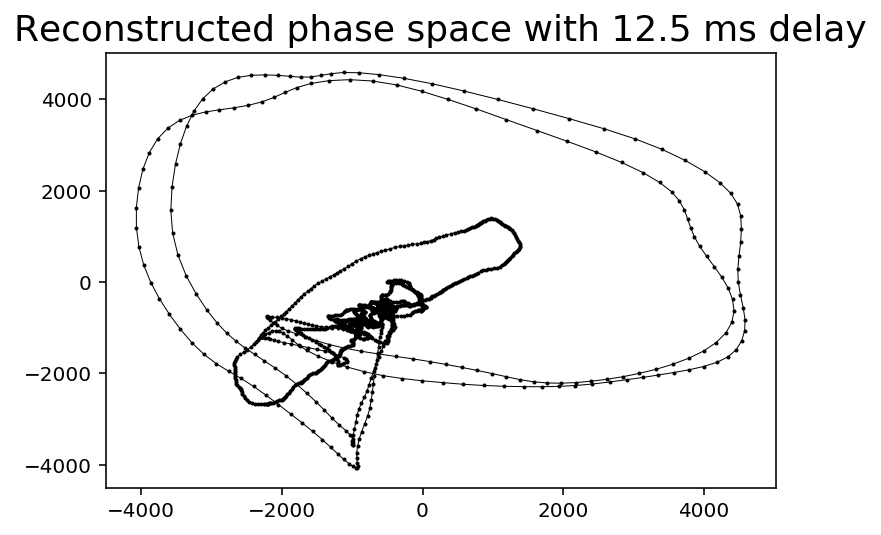

Subject3


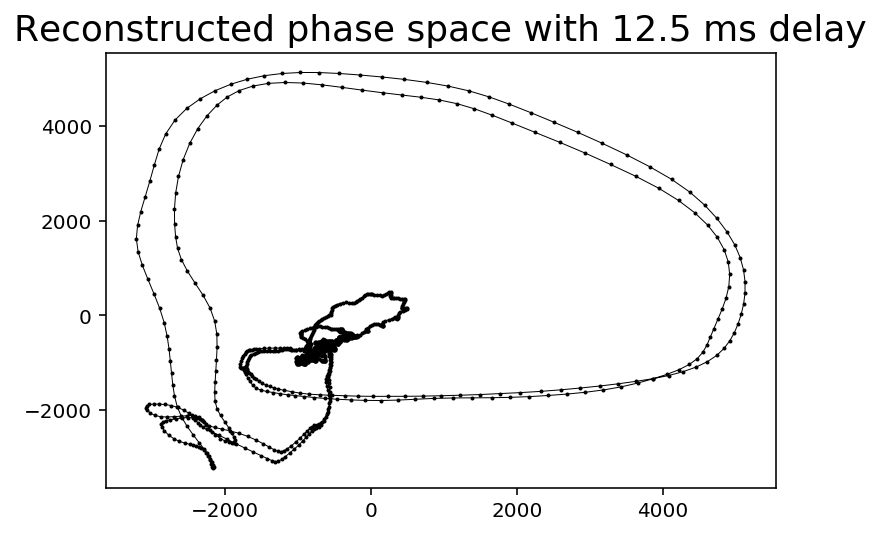

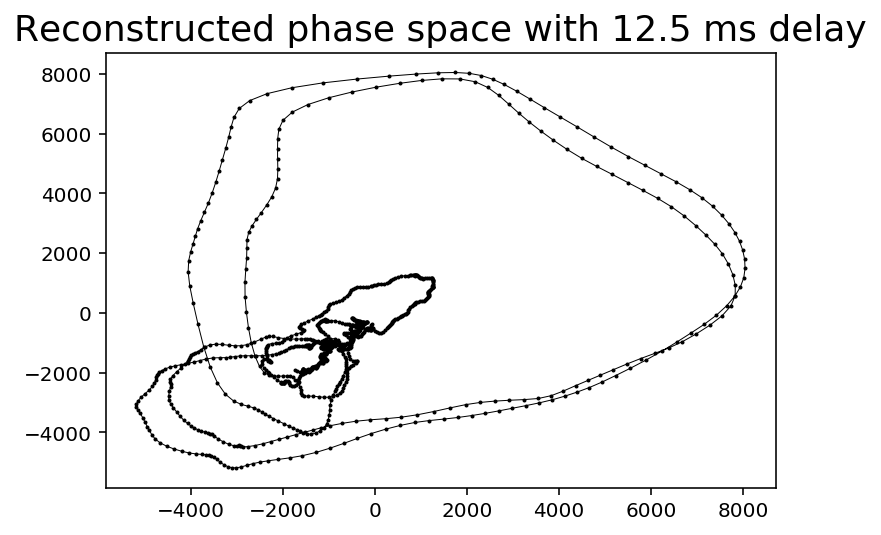

Subject4


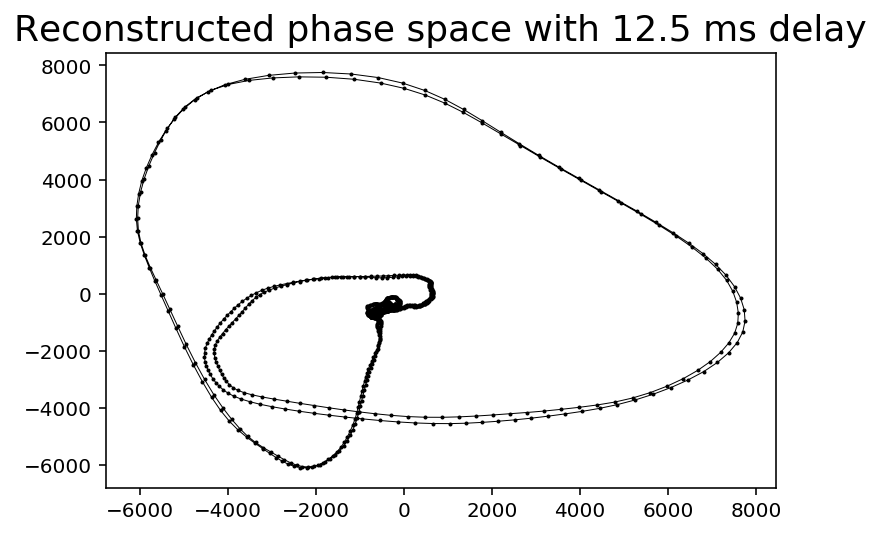

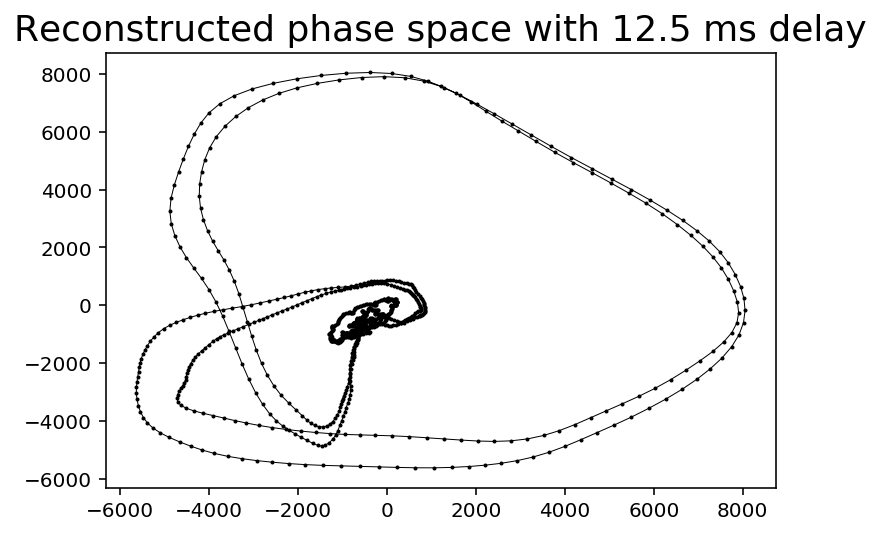

Subject5


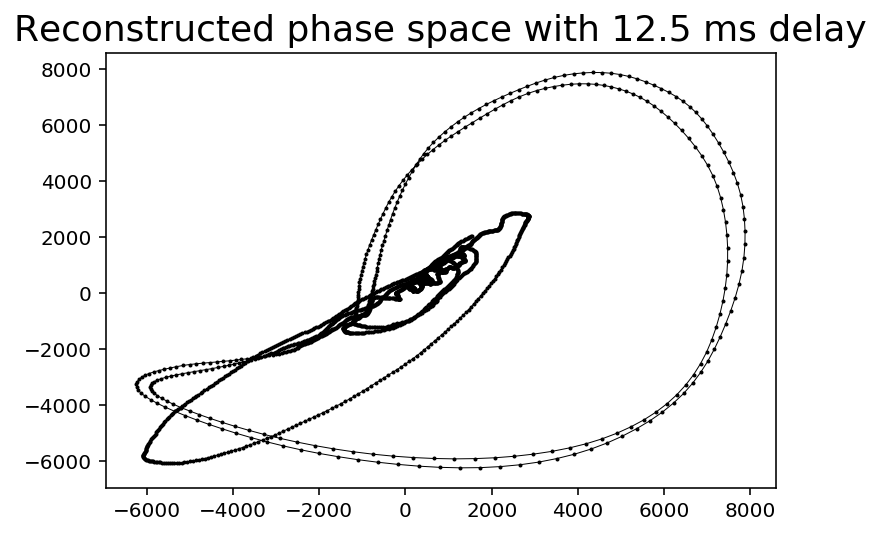

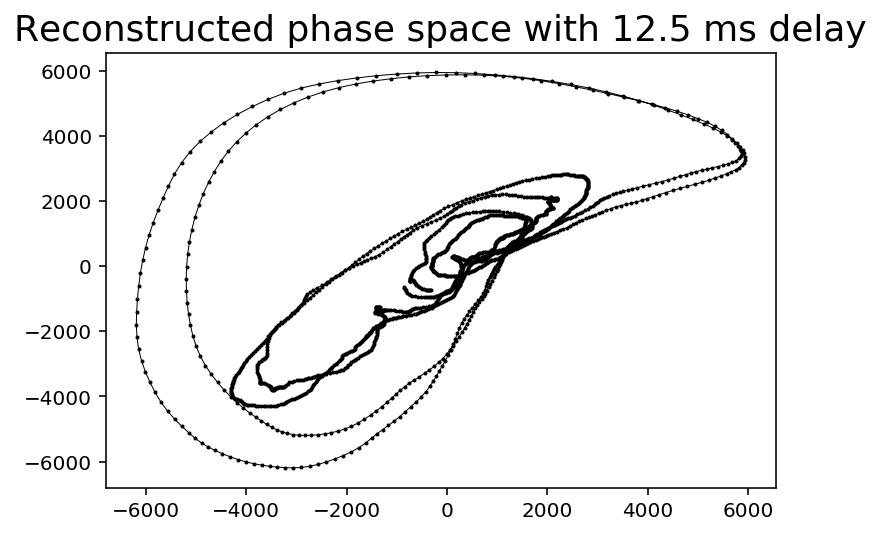

Subject6


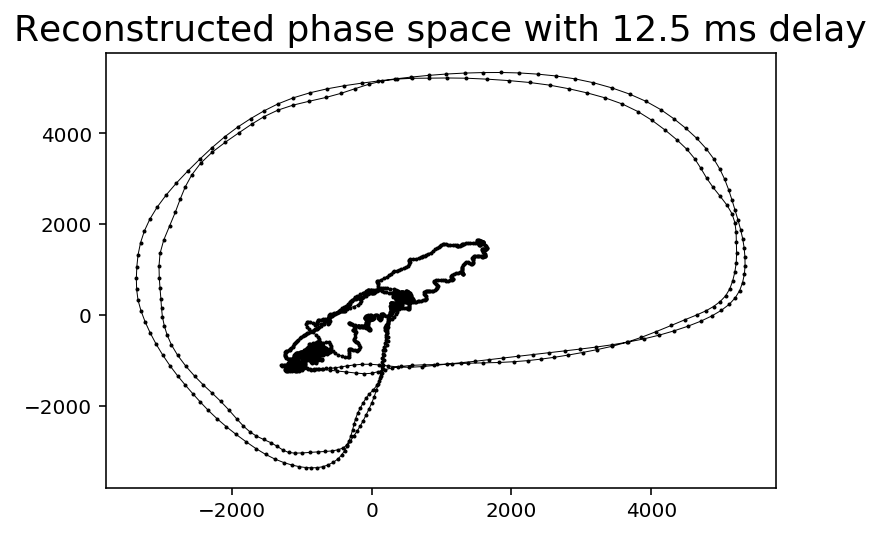

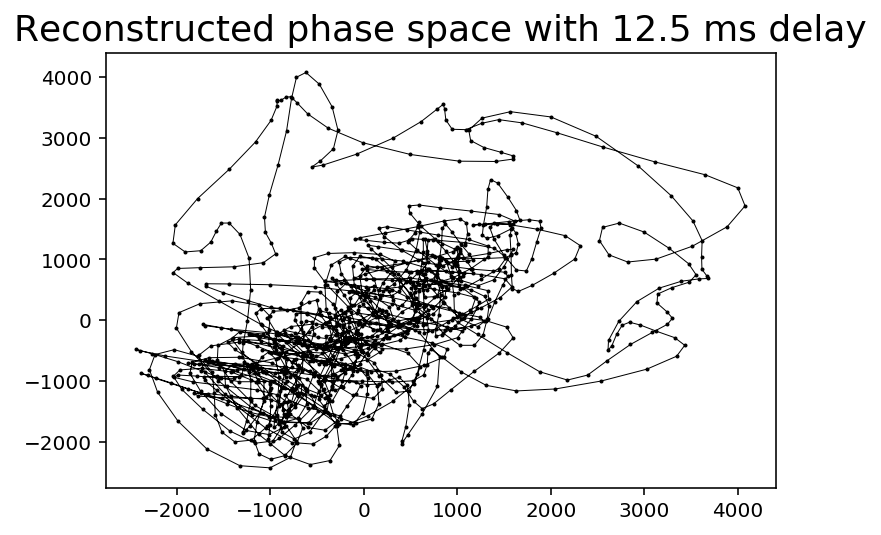

Subject7


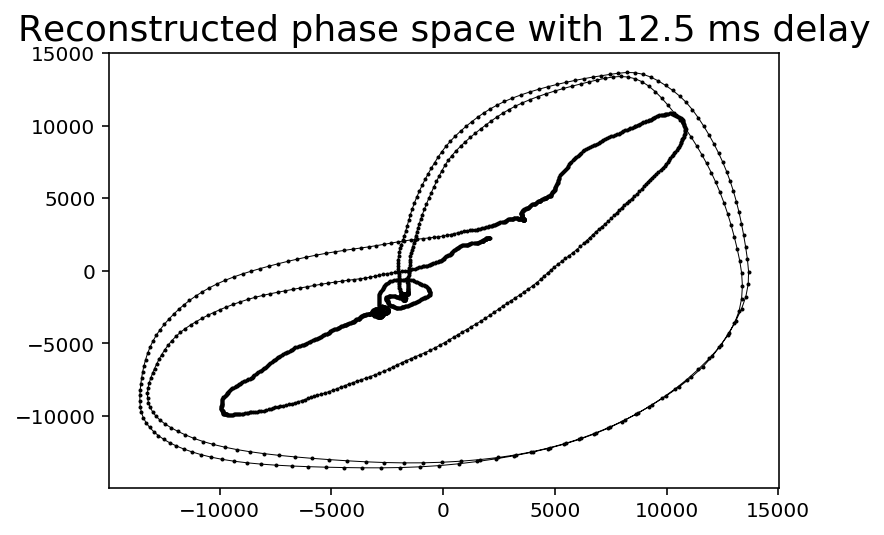

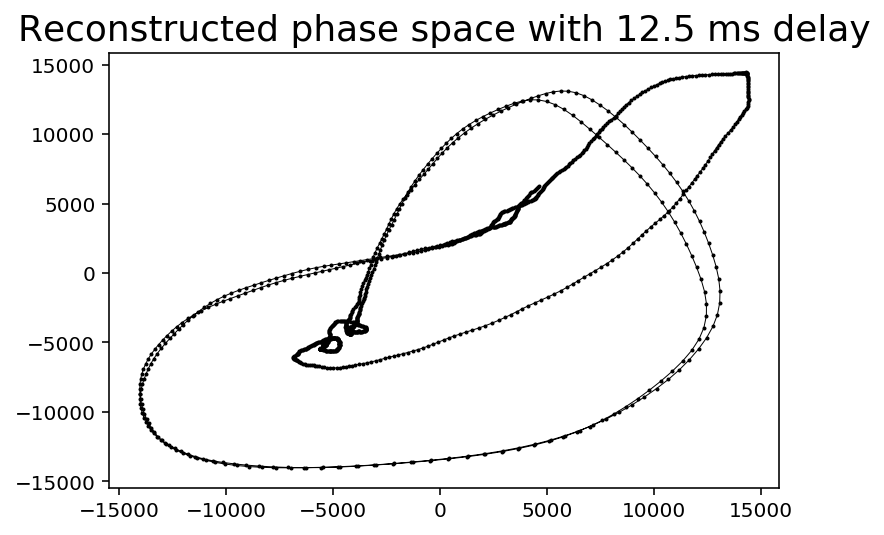

In [72]:
# Reconstructing the attractor
for i in range(0, 7):
    print("Subject"+str(i+1))
    n = np.size(waveData_rest_surrogates[i])
    plt.plot(waveData_rest_surrogates[i][0: n-data_point_delay],
             waveData_rest_surrogates[i][data_point_delay: n],
              marker = "o", markersize = 1, linewidth = 0.5, color = "black")
    plt.title("Reconstructed phase space with 12.5 ms delay")
    plt.show()
    
    n = np.size(waveData_exer_surrogates[i])
    plt.plot(waveData_exer_surrogates[i][0: n-data_point_delay],
             waveData_exer_surrogates[i][data_point_delay: n],
              marker = "o", markersize = 1, linewidth = 0.5, color = "black")
    plt.title("Reconstructed phase space with 12.5 ms delay")
    plt.show()

Now, we create the recurrence plot.

In [73]:
normal_euclid_rest = []
normal_euclid_exer = []

for i in range (0, 7):
    normal_euclid_rest.append(recurrence_plot(waveData_rest_surrogates[i], 25))
    normal_euclid_exer.append(recurrence_plot(waveData_exer_surrogates[i], 25)) 
    print("Finished subject "+str(i+1))

Finished subject 1
Finished subject 2
Finished subject 3
Finished subject 4
Finished subject 5
Finished subject 6
Finished subject 7


In [74]:
index_surrogate_rest = []
index_surrogate_exer = []

#Creating a vector with the indices for the surrogate data
for i in range(0, 7):
    index_surrogate_rest.append([i for i in range(0, len(waveData_rest_surrogates[i]))])
    index_surrogate_exer.append([i for i in range(0, len(waveData_exer_surrogates[i]))])

Subject 1


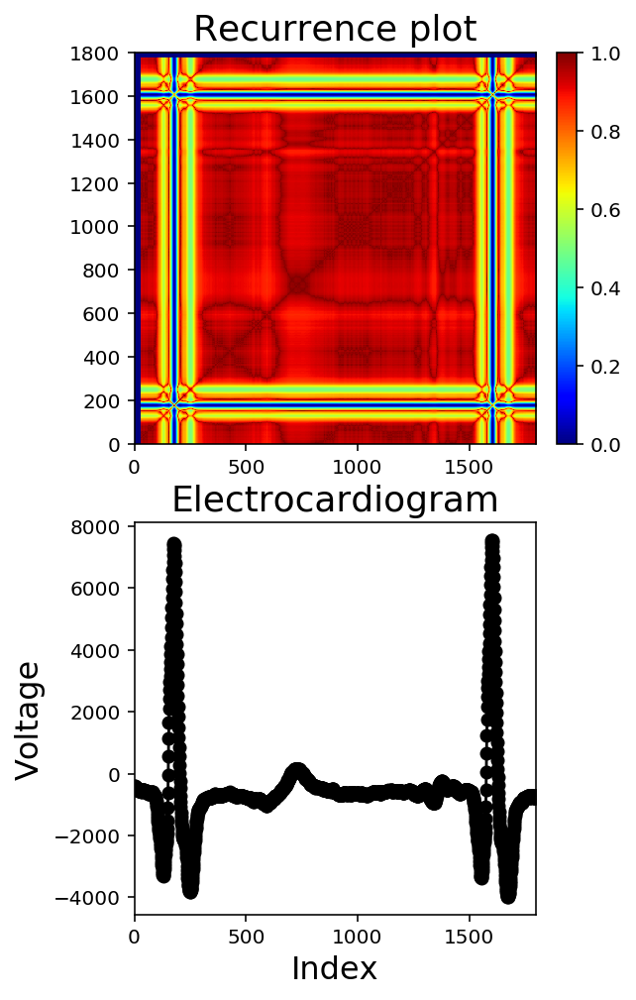

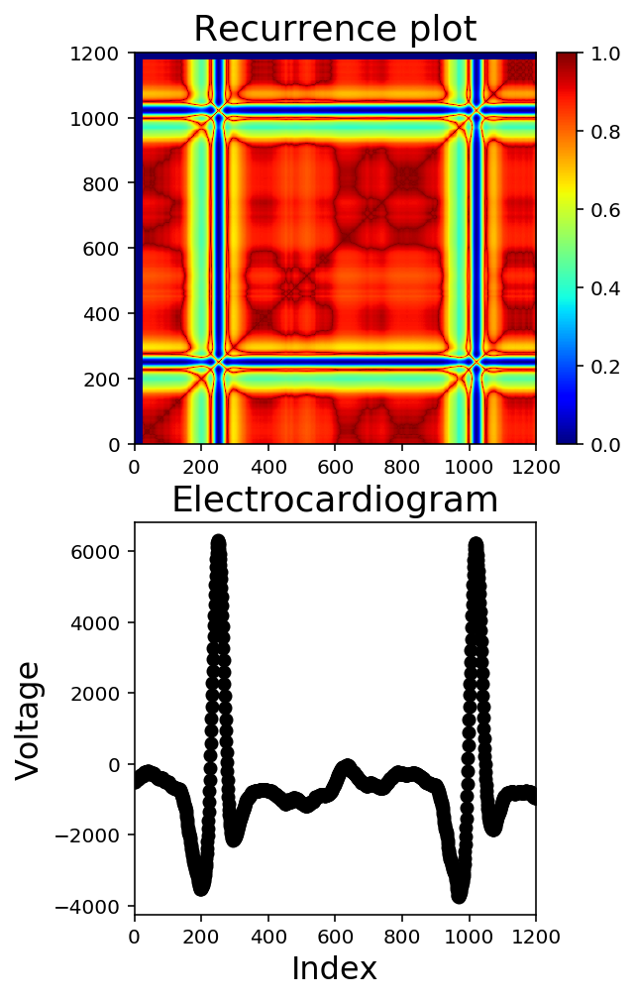

Subject 2


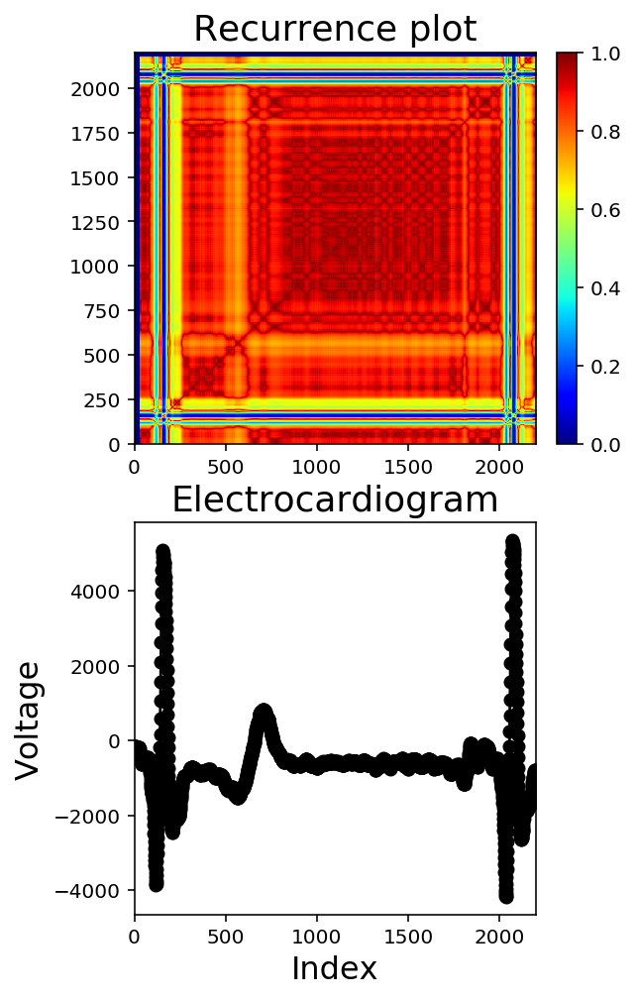

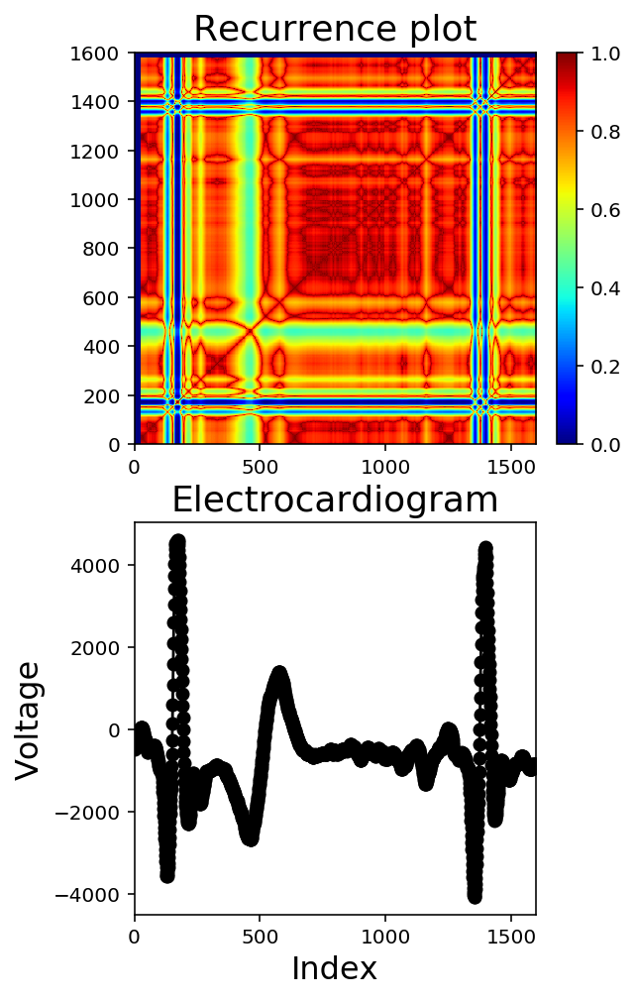

Subject 3


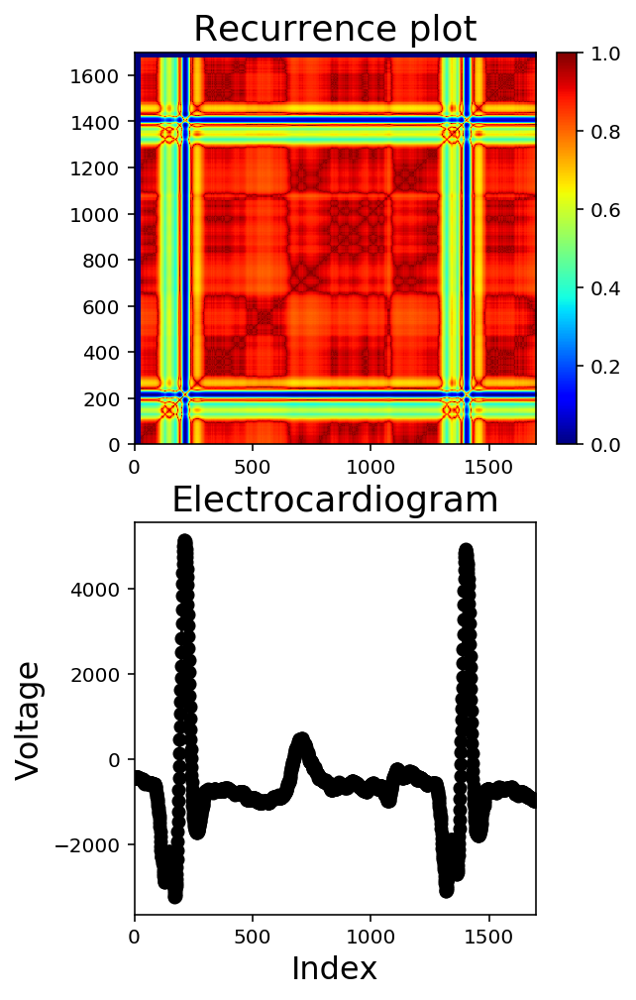

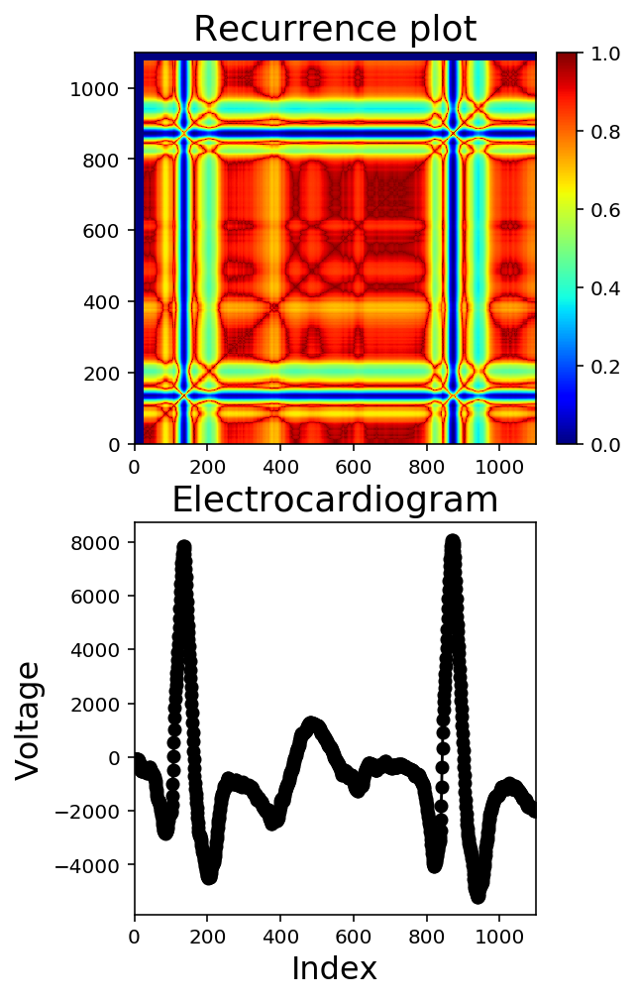

Subject 4


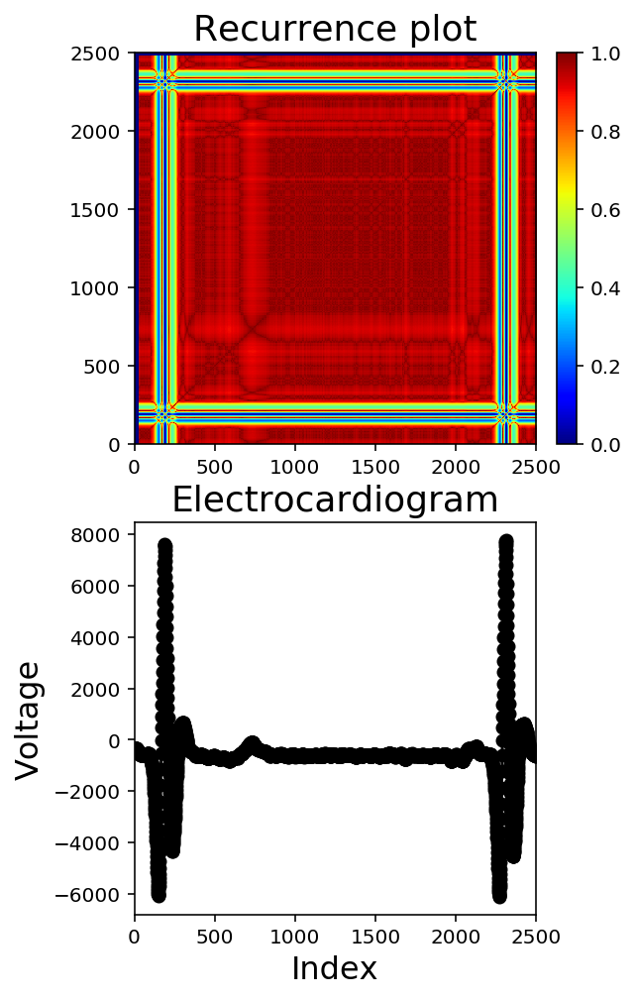

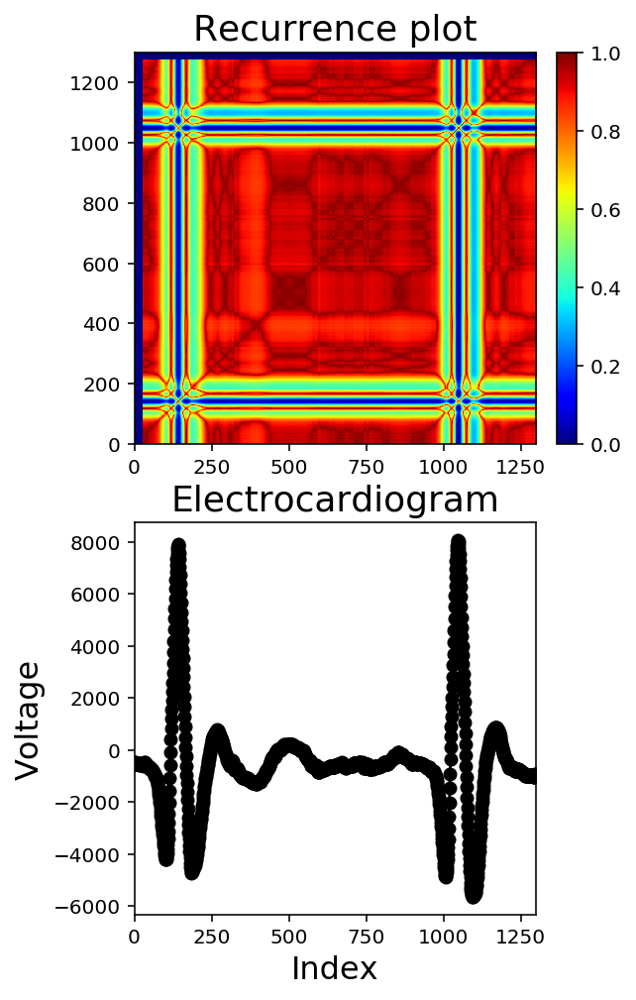

Subject 5


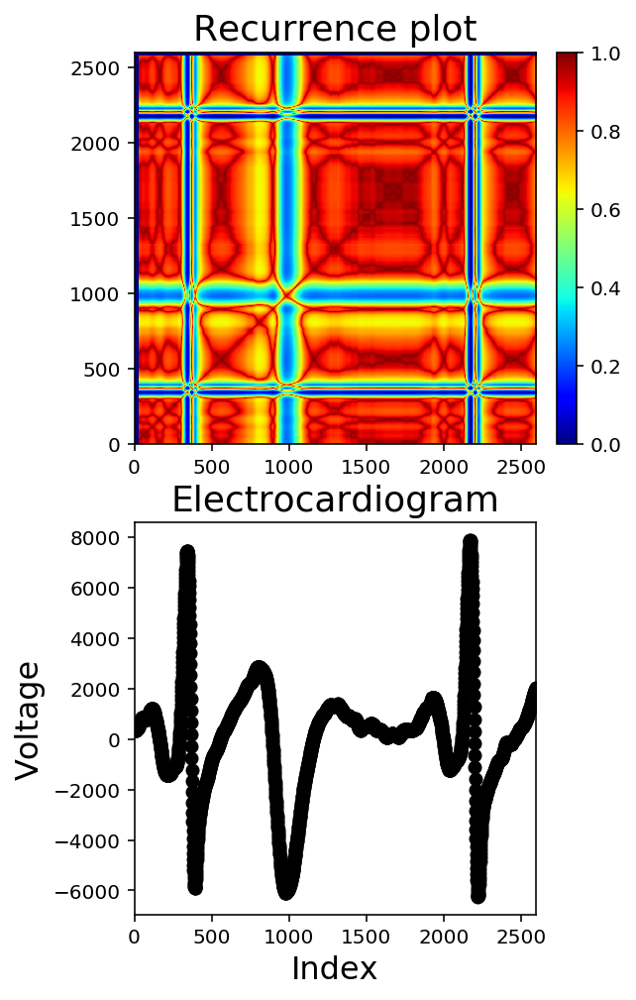

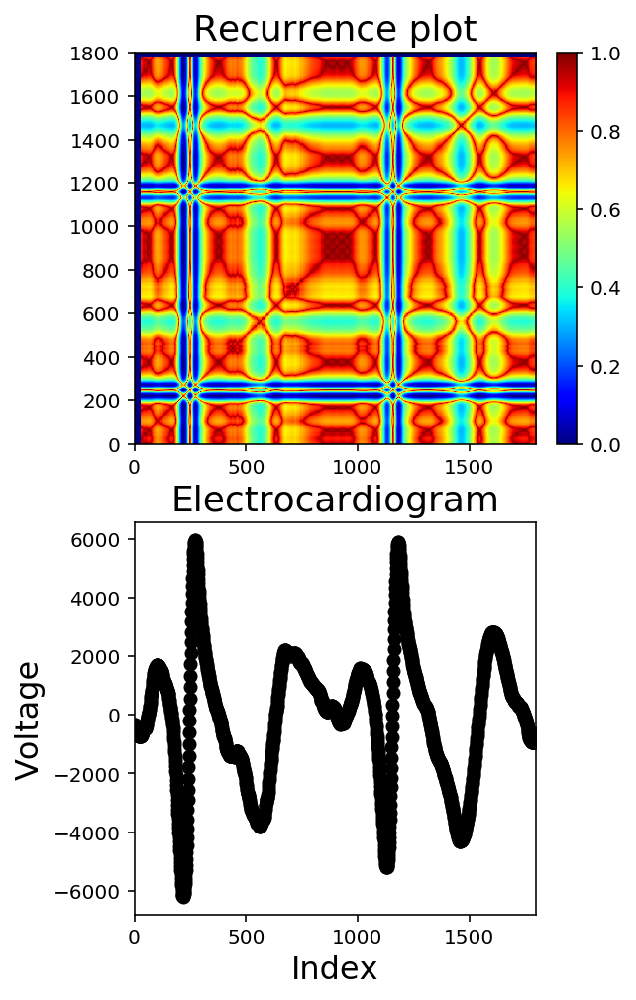

Subject 6


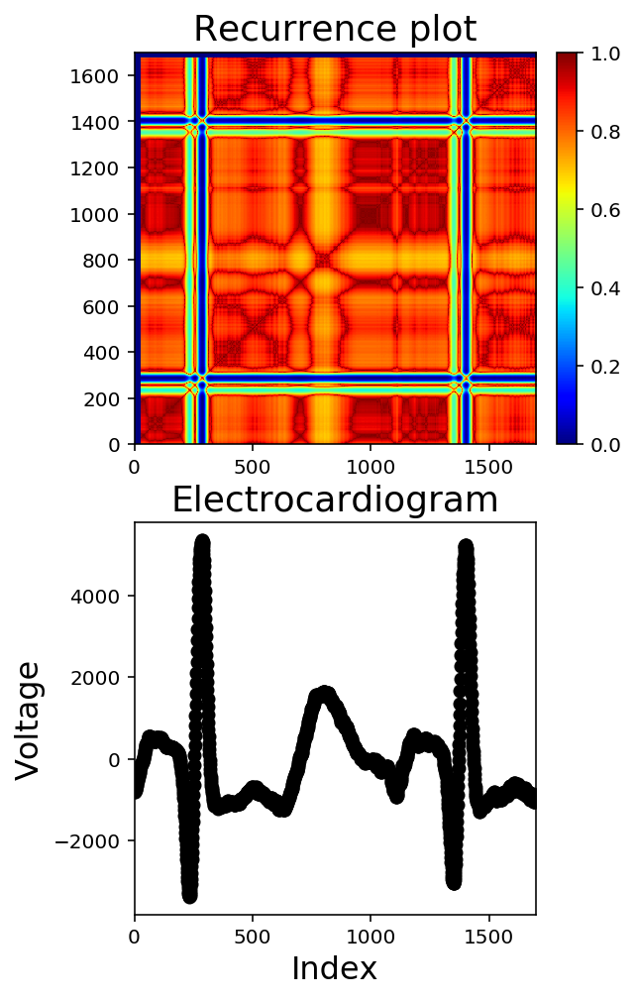

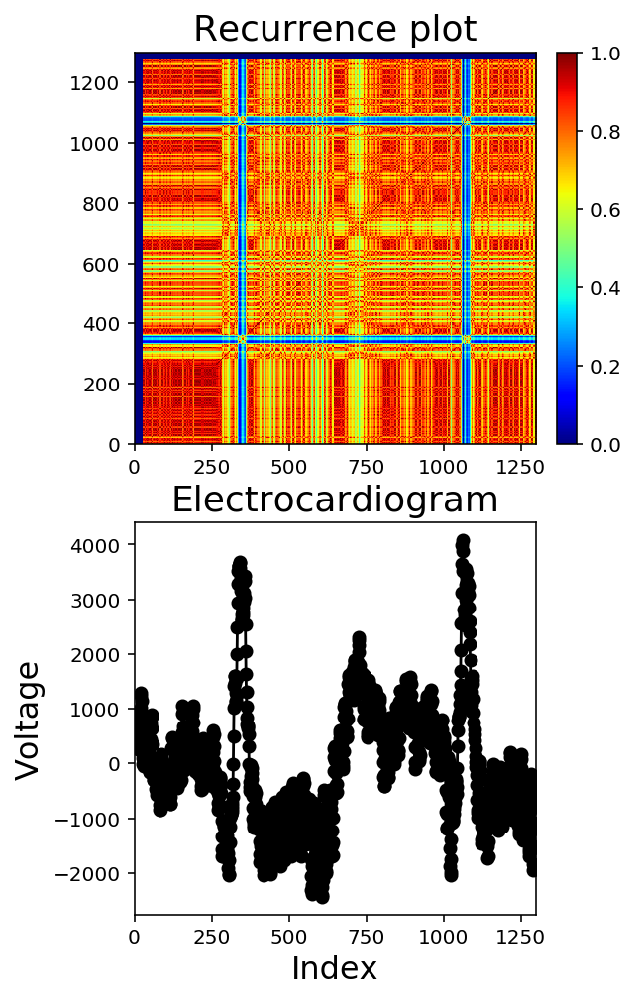

Subject 7


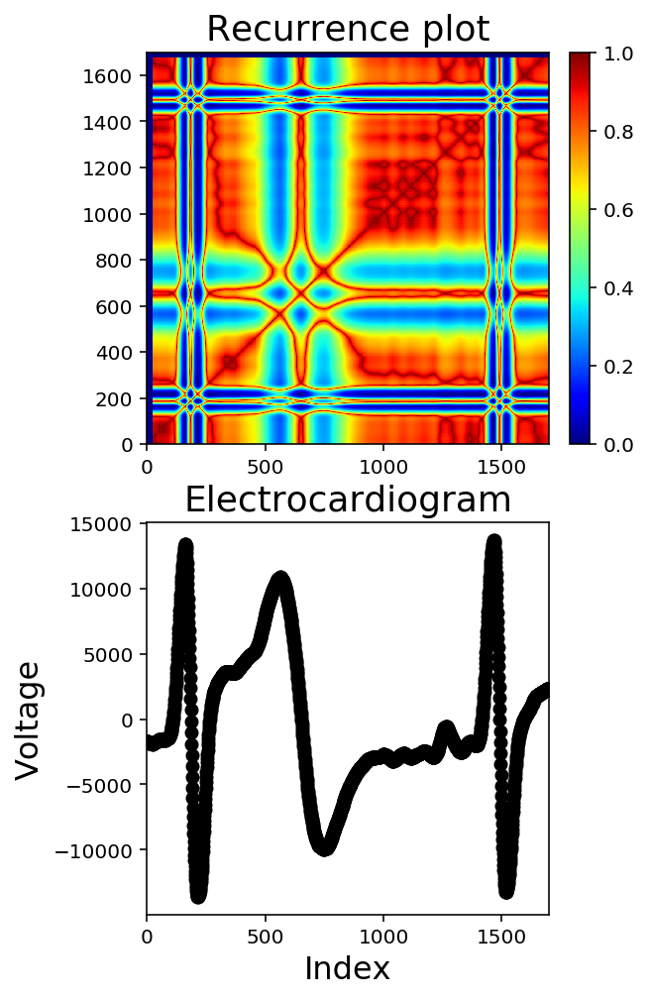

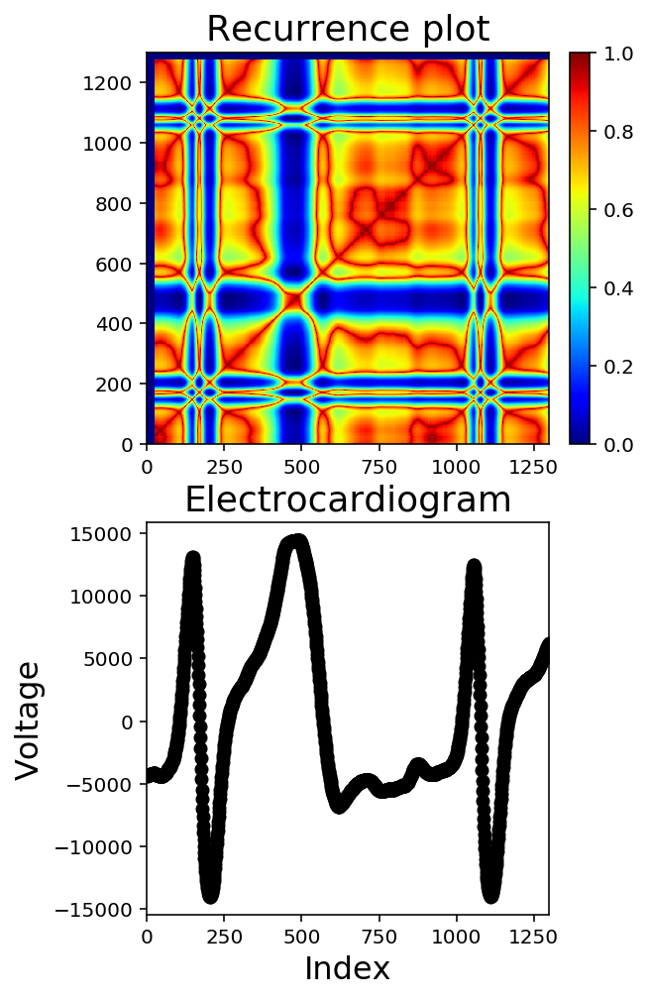

In [75]:
for i in range(0, 7):
    print("Subject " + str(i+1))
    graph_recurrence(waveData_rest_surrogates[i], index_surrogate_rest[i],
                     normal_euclid_rest[i])
    graph_recurrence(waveData_exer_surrogates[i], index_surrogate_exer[i],
                     normal_euclid_exer[i])

Let's visualize side by side in this technique the comparison with rest or after exercise.

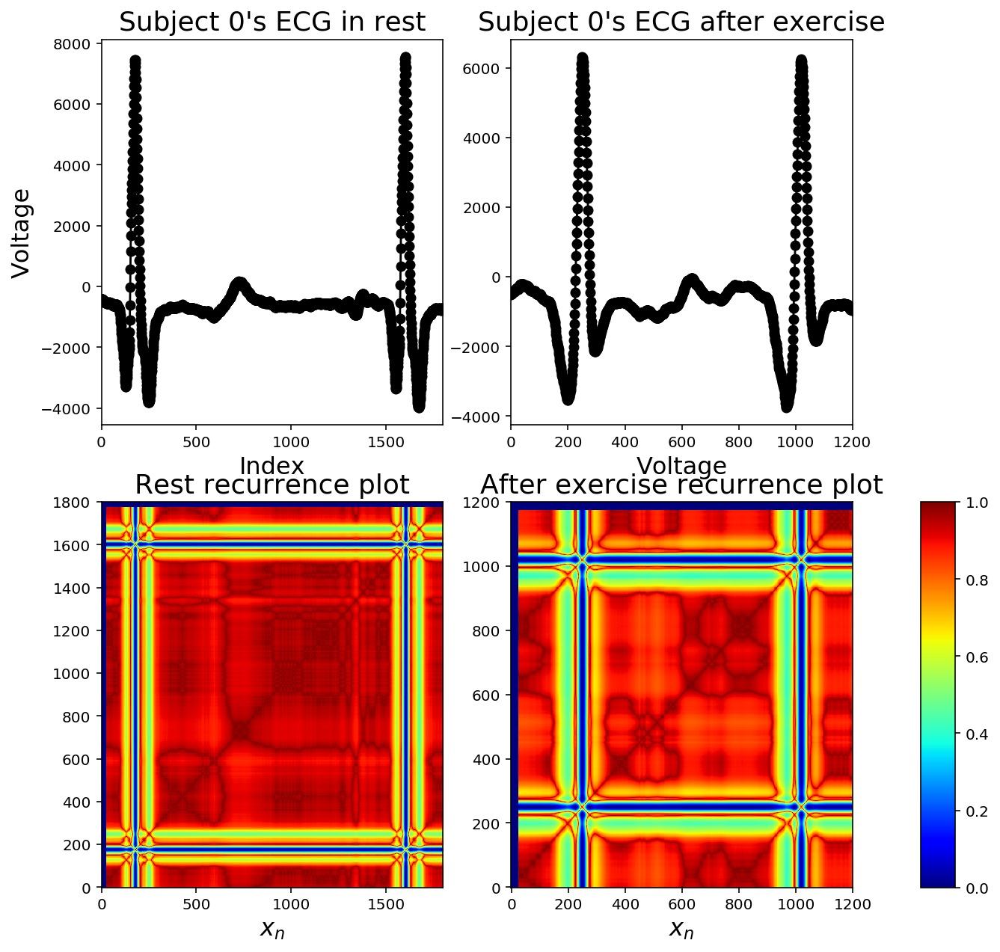

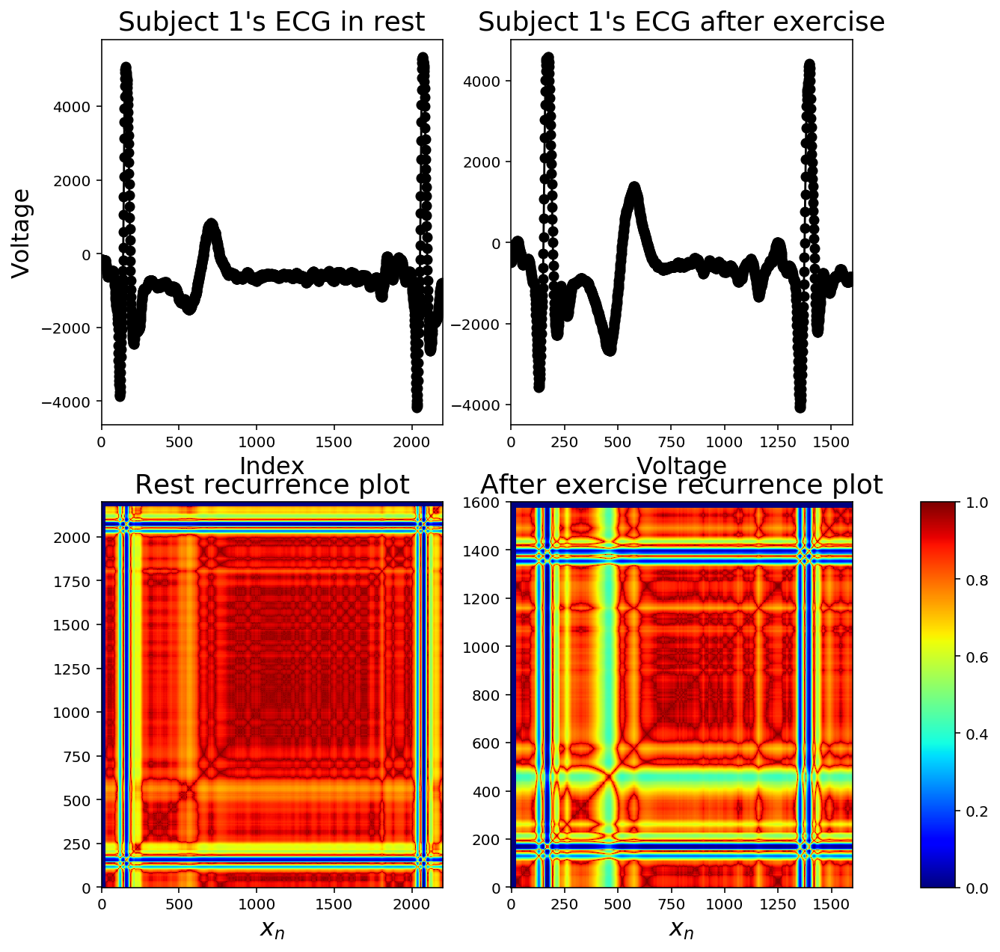

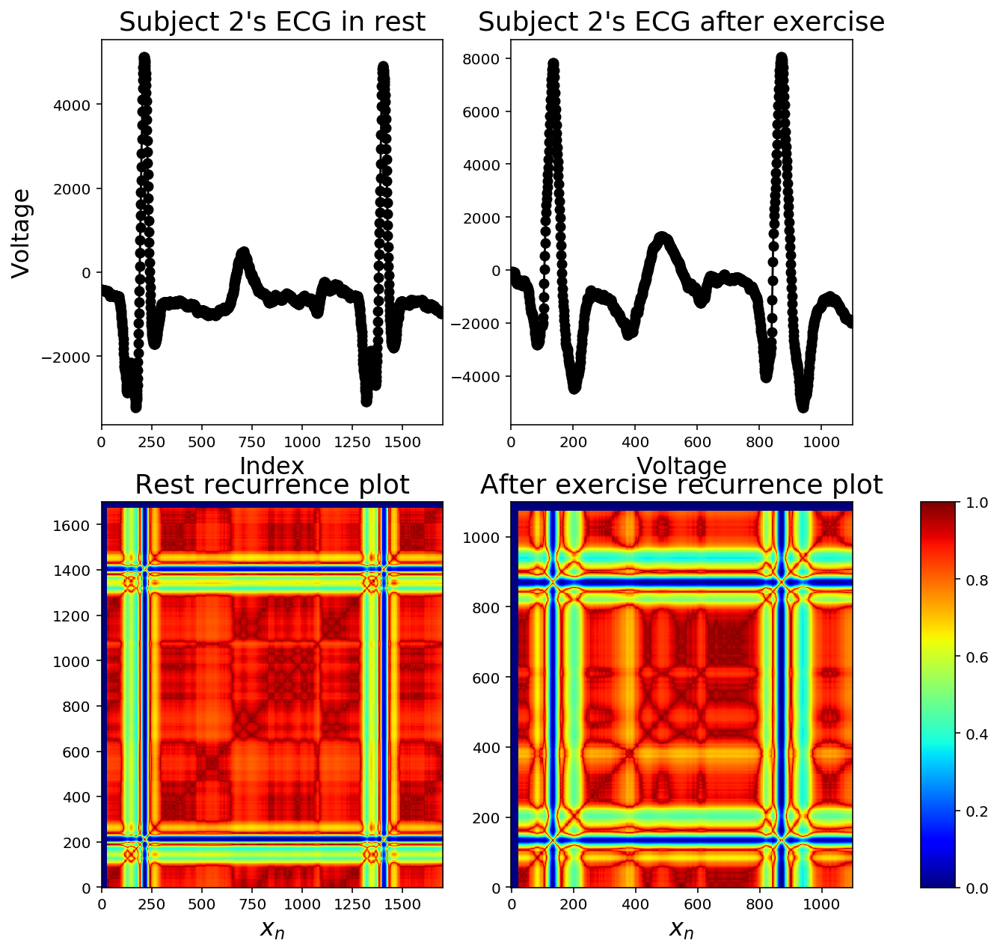

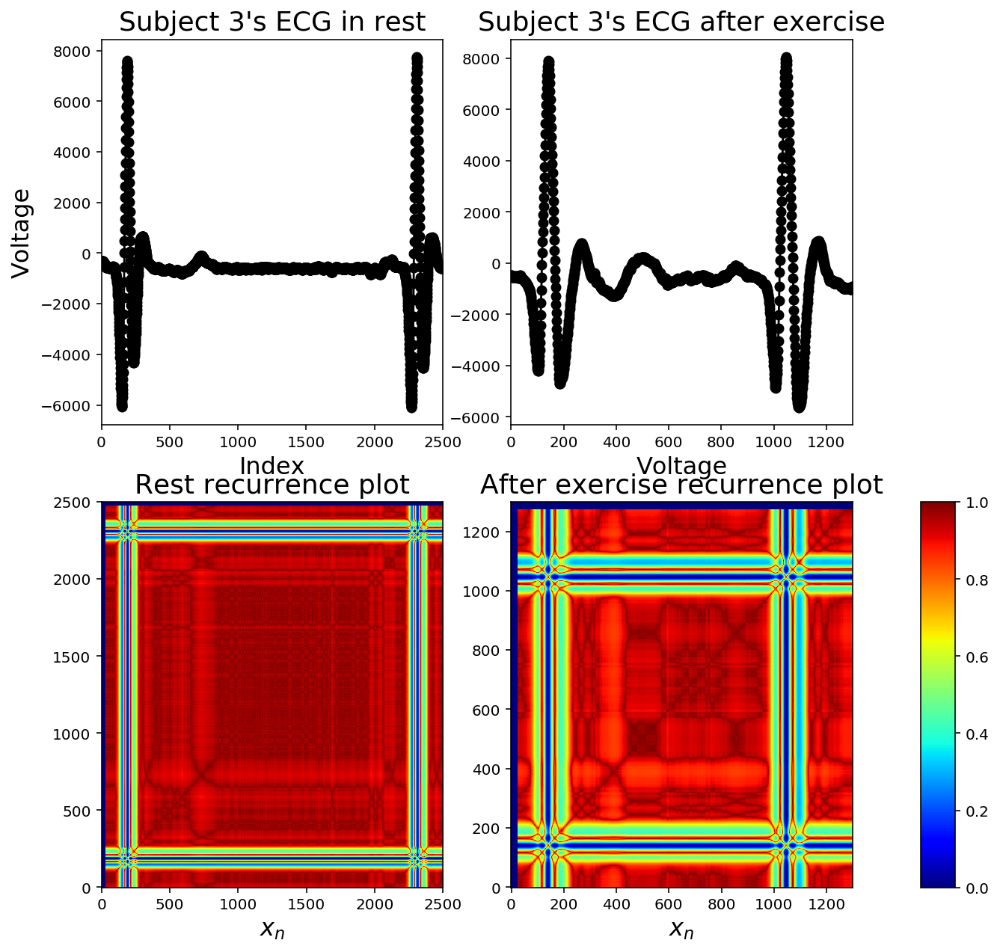

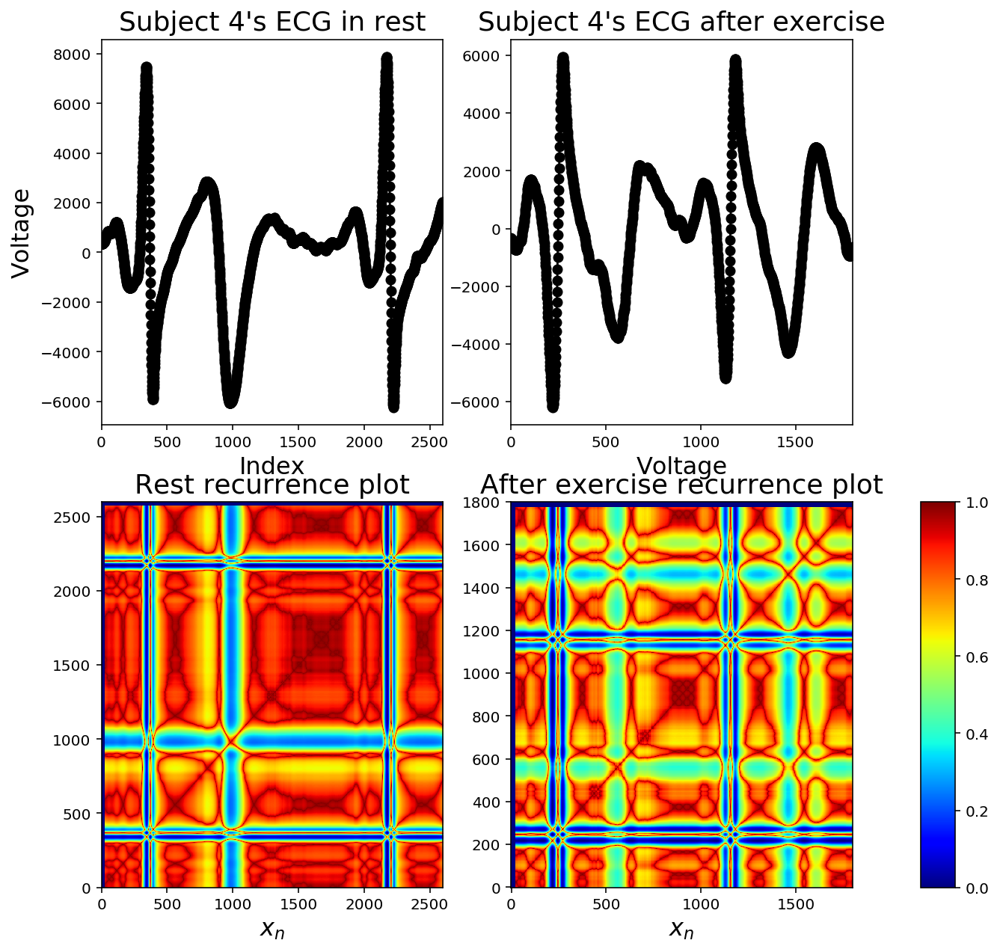

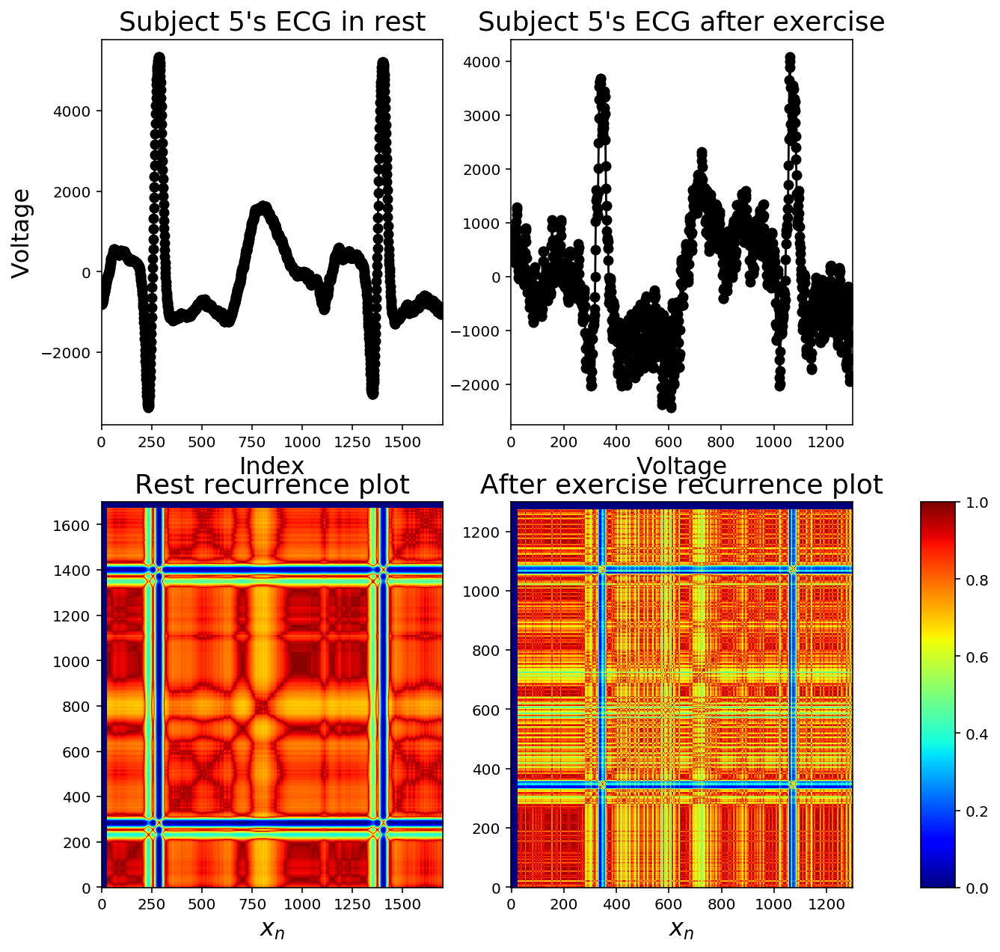

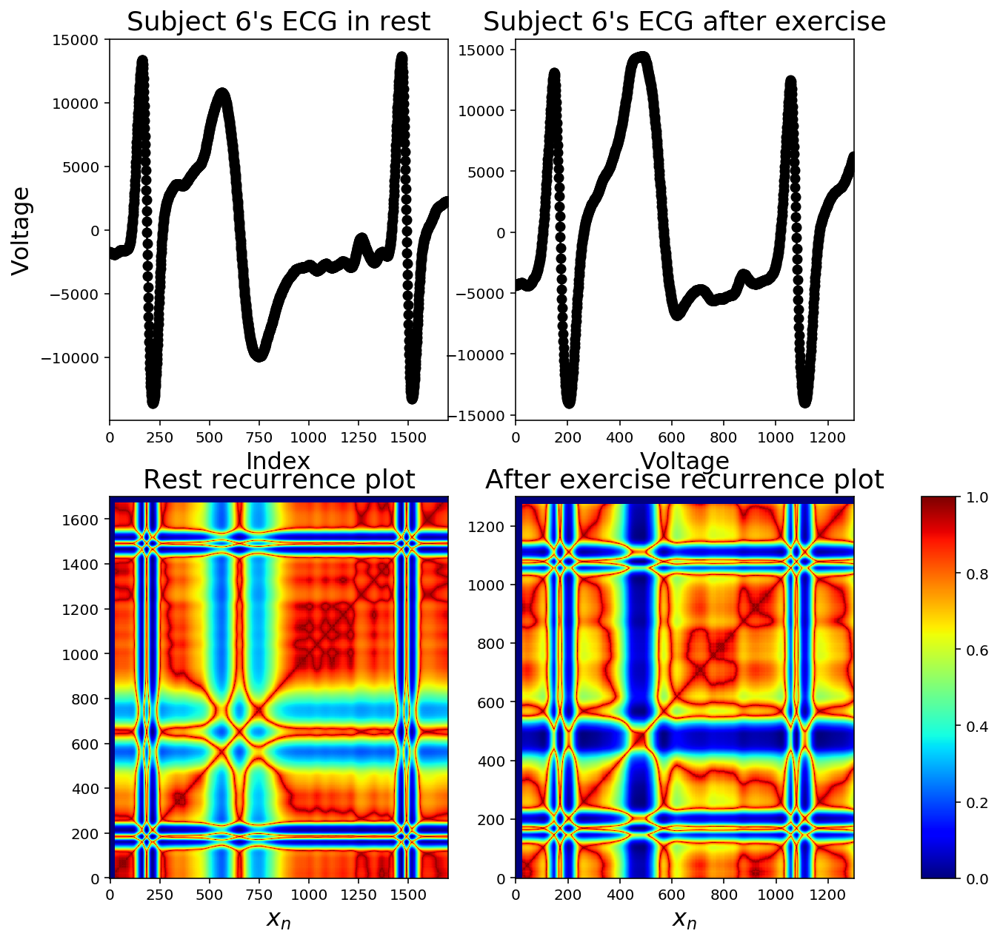

In [76]:
for i in range(0, 7):
    fig, axs = plt.subplots(2,2,figsize=(9,9)) #figsize=(6,8)

    axs[0, 0].plot(index_surrogate_rest[i], waveData_rest_surrogates[i],
                   marker="o", c="k")
    axs[0, 0].set_title("Subject "+str(i+1)+"'s ECG in rest")
    axs[0, 0].set_xlabel("Index")
    axs[0, 0].set_ylabel("Voltage")
    axs[0, 0].set_xlim(0, len(index_surrogate_rest[i]))

    axs[0, 1].plot(index_surrogate_exer[i], waveData_exer_surrogates[i],
                   marker="o", c="k")
    axs[0, 1].set_title("Subject "+str(i+1)+"'s ECG after exercise")
    axs[0, 1].set_xlabel("Index")
    axs[0, 1].set_xlabel("Voltage")
    axs[0, 1].set_xlim(0, len(index_surrogate_exer[i]))

    plot = axs[1, 0].imshow(normal_euclid_rest[i], origin='lower',
                            aspect="auto", cmap="jet")
    axs[1, 0].set_title("Rest recurrence plot")
    axs[1, 0].set_xlabel(r"$x_n$")
    axins = inset_axes(axs[1,0],
                   width="10%", # width = 10% of parent_bbox width
                   height="100%", # height : 50%
                   loc=6,
                   bbox_to_anchor=(2.4, 0, 1, 1),
                   bbox_transform=axs[1,0].transAxes,
                   borderpad=0,)

    axs[1, 1].imshow(normal_euclid_exer[i], origin='lower', aspect="auto", cmap="jet")
    axs[1, 1].set_title("After exercise recurrence plot")
    axs[1, 1].set_xlabel(r"$x_n$")

    cbar = plt.colorbar(plot, cax=axins)
    fig.subplots_adjust(top=1)

In subject 1 we have the best recording of this small sample data. Notice how at a resting state we observe more random fluctuations around baseline and in the after exercise recording we observe more artifacts in these amplitude changes. The P and T wave are not clearly distinguishable in the recording. In the recurrence plot these amplitude changes are clearly observed because of pattern emergence. Also, notice how the overall red color in the plot diminishes when the individual does exercise. This is because in the reucrrence plot, points lie overall farther away from each other.

In subject 2 we also see a change in the amplitude of the T wave. This is seen in the recurrence plot by a band of 0.4 that is light blue.

Subject 3 and 4 can be interpreted similar to subject 1. The recurrence plot has a certain pattern when the subject is at rest. This pattern changes after the subject performs exercise. And the recurrence plot when the individual is at rest looks like a recurrence plot of white noise, except for the moments when a QRS complex occurs.

In subject 5 the presence of artifacts is substantial. Notice how the recurrence plot technique is very sensitive to these artefacts. We did not make a close up of the ECG signal until now. Notice in subject 5 how the ECG signal does not correspond to the common heart singal. In the QRS complex there is a fast increase in the signal followed by a fast decrease, when there should be first a fast decrease followed by a sharp increase. This is just a sign that when recording this signal, the electrodes were exchanged. Besides, notice the big changes in the signal's amplitude between QRS complexes. This is just a sign of a bad recording.

In subject 6 after exercise, we observe a lot of noise in the recording. In this example there was 60 Hz noise. This noise is clearly observed in the recurrence plot.

In subject 7 we observe that the T wave is huge, almost of the same amplitude as the QRS peak. This is an artefact which is exacerbated in the recurrence plot. We observe a blue region in the recurrence plot when the T wave occurs in the ECG.

# Final remarks
As you have seen in this notebook, it is not always valid to use certain techniques. There are certain conditions that must be met before we can use these techniques.